In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white", context='poster')
import math

In [2]:
import datashader as ds, datashader.transfer_functions as tf
import dask.dataframe as dd

In [3]:
%load_ext autoreload
%autoreload 2


In [4]:
plot_width  = int(900)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)

In [5]:
plot_width  = int(900)
plot_height  = plot_width

#plot_height = int(plot_width*7.0/12)
#background = "black"
background=None

from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9

export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

In [6]:
import sys
sys.path.append('..')
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [7]:
corder = ['C1', 'C2', 'C3', 'C4', 'C0']

In [8]:
morder = ['EXOENZYME','OVERFLOW',   'ROS','MIXOTROPH']# ,'MIN', ]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
mpalette = sns.color_palette(mpalette, n_colors=4)
#morder = [morder[1]] + morder[3:]
#mpalette = [mpalette[1]] + mpalette[3:]
sns.color_palette(mpalette)

[(0.42790652284925834, 0.5649543060909209, 0.7513944352191484),
 (0.3269137124539796, 0.1157873496841953, 0.4865864649569746),
 (0.39199887556812907, 0.09691583650296684, 0.2959521200550908),
 (0.7531856636904657, 0.45841199172949604, 0.3686223664223477)]

In [9]:
gorder = [ 'Strong', 'Sustained', 'Inhibited', 'Weak', 'Axenic',   'Other']
gpalette = sns.color_palette('Set2', n_colors=4).as_hex() + ['black', 'lightgrey']
gpalette = ['#882255', '#CC6677', '#332288', 
             '#44AA99','#88CCEE',
            '#D0CFCA',  ]

sns.color_palette(gpalette)

[(0.5333333333333333, 0.13333333333333333, 0.3333333333333333),
 (0.8, 0.4, 0.4666666666666667),
 (0.2, 0.13333333333333333, 0.5333333333333333),
 (0.26666666666666666, 0.6666666666666666, 0.6),
 (0.5333333333333333, 0.8, 0.9333333333333333),
 (0.8156862745098039, 0.8117647058823529, 0.792156862745098)]

In [10]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [11]:
gorder1 = ['Strong', 'Sustained', 'Weak','Inhibited',  ]
gpalette1 = gpalette[:2] + [gpalette[3], gpalette[2], ]
sns.color_palette(gpalette1)

[(0.5333333333333333, 0.13333333333333333, 0.3333333333333333),
 (0.8, 0.4, 0.4666666666666667),
 (0.26666666666666666, 0.6666666666666666, 0.6),
 (0.2, 0.13333333333333333, 0.5333333333333333)]

In [12]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [13]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = '../results/final/ponly/'

In [14]:
import glob
import os
glob.glob(os.path.join(dpath, "*_sum*"))

['../results/final/ponly/monte_ponly_OVERFLOW-ROS-EXOENZYME_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_fix_OVERFLOW_clean_sum.csv.gz',
 '../results/final/ponly/ponly_monte_add_ROS_round2_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_add_OVERFLOW_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_EXOENZYME-ROS_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_strong_ponly_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-ROS-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-EXOENZYME-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_OVERFLOW-ROS_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_ROS-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_EXOENZYME-ROS-MIXOTROPH_clean_sum.csv.gz',
 '../results/final/ponly/monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOEN

In [15]:
'monte_ponly_clean_sum.csv.gz'
'monte_strong_ponly_clean_sum.csv.gz'
'monte_ponly_add_OVERFLOW_clean_sum.csv.gz'
'monte_ponly_fix_OVERFLOW_clean_sum.csv.gz'
'ponly_monte_add_ROS_round2_clean_sum.csv.gz'


'ponly_monte_add_ROS_round2_clean_sum.csv.gz'

In [16]:
sim_df1 = pd.read_csv(os.path.join(dpath,'monte_ponly_clean_sum.csv.gz',))
sim_df2 = pd.read_csv(os.path.join(dpath,'monte_strong_ponly_clean_sum.csv.gz',))
sim_df3 = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_OVERFLOW_clean_sum.csv.gz',))
sim_df4 = pd.read_csv(os.path.join(dpath,'monte_ponly_add_OVERFLOW_clean_sum.csv.gz',))
sim_df5 = pd.read_csv(os.path.join(dpath,'ponly_monte_add_ROS_round2_clean_sum.csv.gz',))


In [17]:
sim_df6 = pd.read_csv(os.path.join(dpath,'monte_extend_ponly_clean_sum.csv.gz',))

multi_ponly_orig_fnames = [
'monte_ponly_EXOENZYME-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_EXOENZYME-ROS_clean_sum.csv.gz',
'monte_ponly_EXOENZYME-ROS-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-EXOENZYME_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-EXOENZYME-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-ROS_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-ROS-EXOENZYME_clean_sum.csv.gz',
'monte_ponly_OVERFLOW-ROS-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_ROS-MIXOTROPH_clean_sum.csv.gz',
'monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_clean_sum.csv.gz',
]
sim_df7 = pd.concat([pd.read_csv(os.path.join(dpath,f,)) for f in multi_ponly_orig_fnames], ignore_index=True)


In [18]:
sim_df1['Phase'] = 'init'
sim_df2['Phase'] = 'add'
sim_df3['Phase'] = 'init'
sim_df4['Phase'] = 'add'
sim_df5['Phase'] = 'round2'
sim_df6['Phase'] = 'extend'
sim_df7['Phase'] = 'init'


In [19]:
# remove buggy overflow simulations
sim_df1 = sim_df1.loc[~sim_df1.run_id.str.startswith('monte_ponly_OVERFLOW')].copy()
sim_df2 = sim_df2.loc[~sim_df2.run_id.str.startswith('monte2_ponly_OVERFLOW')].copy()


In [20]:
sim_df1[['id', 'media', 'which', 'model', 'hash']] =     sim_df1.run_id.str.rsplit('_', n=4, expand=True)
sim_df2[['id', 'media', 'which', 'model', 'hash']] =     sim_df2.run_id.str.rsplit('_', n=4, expand=True)
sim_df3[['id', 'media', 'which', 'model', 'hash']] =     sim_df3.run_id.str.rsplit('_', n=4, expand=True)
sim_df4[['id', 'media', 'which', 'model', 'hash']] =     sim_df4.run_id.str.rsplit('_', n=4, expand=True)
sim_df5[['id', 'media', 'which', 'model', 'hash']] =     sim_df5.run_id.str.rsplit('_', n=4, expand=True)
sim_df6[['id', 'media', 'which', 'model', 'hash']] =     sim_df6.run_id.str.rsplit('_', n=4, expand=True)
sim_df7[['id', 'media', 'which', 'model', 'hash']] =     sim_df7.run_id.str.rsplit('_', n=4, expand=True)


In [21]:
sim_df1['VPRO_nocluster'] = sim_df1.idx.str.replace('monte_ponly_','vpro_', regex=False)
sim_df1['VPRO_nocluster'] = sim_df1['VPRO_nocluster'].str.replace('_monte__','_', regex=False)
for m in morder:
    sim_df1['VPRO_nocluster'] = sim_df1['VPRO_nocluster'].str.replace(f'_{m}_','_', regex=False)


In [22]:
sim_df2['VPRO'] = sim_df2.idx.str.replace('monte2_ponly_','', regex=False)
sim_df2['VPRO'] = sim_df2['VPRO'].str.replace(r'_monte__(\d+)_[^_]+$', r'\1', regex=True)
sim_df2['VPRO'] = sim_df2['VPRO'].str.replace(r'.*_vpro', 'vpro', regex=True)


In [23]:
sim_df3['VPRO'] = sim_df3.idx.str.replace('monte_ponly_fix_OVERFLOW_','vpro_2_', regex=False)
sim_df3['VPRO'] = sim_df3['VPRO'].str.replace('_monte__','_', regex=False)
for m in morder:
    sim_df3['VPRO'] = sim_df3['VPRO'].str.replace(f'_{m}_','_', regex=False)


In [24]:
sim_df4['VPRO'] = sim_df4.idx.str.replace('monte2_ponly_OVERFLOW_','', regex=False)
sim_df4['VPRO'] = sim_df4['VPRO'].str.replace(r'_monte__(\d+)_[^_]+$', r'\1', regex=True)
sim_df4['VPRO'] = sim_df4['VPRO'].str.replace(r'.*_vpro', 'vpro', regex=True)


In [25]:
#sim_df6['VPRO'] = sim_df6.idx.str.replace('monte2_ponly_OVERFLOW_','', regex=False)
sim_df5['VPRO'] = sim_df5['idx'].str.replace('_monte__','', regex=False)
sim_df5['VPRO'] = sim_df5['VPRO'].str.replace(r'.*_vpro', 'vpro_2', regex=True)


In [26]:
#sim_df6['VPRO'] = sim_df6.idx.str.replace('monte2_ponly_OVERFLOW_','', regex=False)
sim_df6['VPRO'] = sim_df6['idx'].str.replace('_monte__','_', regex=False)
sim_df6['VPRO'] = sim_df6['VPRO'].str.replace(r'.*_vpro', 'vpro_3', regex=True)


In [27]:
sim_df7['VPRO'] = sim_df7.idx.str.replace('monte_ponly_','vpro_', regex=False)
sim_df7['VPRO'] = sim_df7['VPRO'].str.replace('_monte__','_', regex=False)
for m in sim_df7.model.unique():
    sim_df7['VPRO'] = sim_df7['VPRO'].str.replace(f'_{m}_','_', regex=False)


In [28]:
sim_df2['VPRO_nocluster'] = sim_df2['VPRO']
sim_df3['VPRO_nocluster'] = sim_df3['VPRO']
sim_df4['VPRO_nocluster'] = sim_df4['VPRO']
sim_df5['VPRO_nocluster'] = sim_df5['VPRO']
sim_df6['VPRO_nocluster'] = sim_df6['VPRO']
sim_df7['VPRO_nocluster'] = sim_df7['VPRO']



In [29]:
df = pd.concat([
    sim_df1,
    sim_df2,
    sim_df3,
    sim_df4,
    sim_df5,
    sim_df6,
    sim_df7,
    
], ignore_index=True)

In [30]:
df

,VmaxICp,VmaxICh,VmaxINp,VmaxINh,VmaxOCp,VmaxOCh,VmaxONp,VmaxONh,KICp,KICh,...,run_id,idx,Phase,id,media,which,model,hash,VPRO_nocluster,VPRO
0,0.000002,0.0,2.563161e-06,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,37.000000,1.0,...,monte_ponly_EXOENZYME_76_monte__69_pro99_ponly...,monte_ponly_EXOENZYME_76_monte__69_EXOENZYME,init,monte_ponly_EXOENZYME_76_monte__69,pro99,ponly,EXOENZYME,h2291012746155587316,vpro_76_69_EXOENZYME,NaN
1,0.000006,0.0,3.520779e-05,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,24.605317,1.0,...,monte_ponly_EXOENZYME_86_monte__38_lowN_ponly_...,monte_ponly_EXOENZYME_86_monte__38_EXOENZYME,init,monte_ponly_EXOENZYME_86_monte__38,lowN,ponly,EXOENZYME,h2291012746155587316,vpro_86_38_EXOENZYME,NaN
2,0.000030,0.0,1.030144e-05,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,215.112381,1.0,...,monte_ponly_EXOENZYME_29_monte__60_pro99_ponly...,monte_ponly_EXOENZYME_29_monte__60_EXOENZYME,init,monte_ponly_EXOENZYME_29_monte__60,pro99,ponly,EXOENZYME,h2291012746155587316,vpro_29_60_EXOENZYME,NaN
3,0.000005,0.0,6.256836e-06,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,8.853069,1.0,...,monte_ponly_EXOENZYME_23_monte__20_lowN_ponly_...,monte_ponly_EXOENZYME_23_monte__20_EXOENZYME,init,monte_ponly_EXOENZYME_23_monte__20,lowN,ponly,EXOENZYME,h2291012746155587316,vpro_23_20_EXOENZYME,NaN
4,0.000004,0.0,7.170524e-06,0.000002,0.000000e+00,5.541667e-08,0.000000e+00,4.277778e-08,7.193827,1.0,...,monte_ponly_EXOENZYME_20_monte__81_lowN_ponly_...,monte_ponly_EXOENZYME_20_monte__81_EXOENZYME,init,monte_ponly_EXOENZYME_20_monte__81,lowN,ponly,EXOENZYME,h2291012746155587316,vpro_20_81_EXOENZYME,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466169,0.000006,0.0,1.201227e-05,0.000067,1.851852e-06,6.666667e-05,7.544491e-07,6.666667e-05,7.601540,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_6...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_6...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_6...,lowN,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_67_32_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_67_32_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
466170,0.000002,0.0,5.716312e-07,0.000067,2.462753e-07,6.666667e-05,2.545232e-07,6.666667e-05,10.321623,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_2...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_2...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_2...,lowN,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_20_74_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_20_74_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
466171,0.000006,0.0,5.555556e-06,0.000067,1.851852e-06,6.666667e-05,1.111111e-06,6.666667e-05,37.000000,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_3...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_3...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_3...,lowN,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_3_93_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_3_93_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
466172,0.000032,0.0,2.628276e-05,0.000067,1.665043e-06,6.666667e-05,2.714144e-07,6.666667e-05,37.000000,1.0,...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_7...,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_7...,init,monte_ponly_ROS-MIXOTROPH-OVERFLOW-EXOENZYME_7...,pro99,ponly,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,h-8424373099480423188,vpro_79_86_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,vpro_79_86_ROS-MIXOTROPH-OVERFLOW-EXOENZYME


In [31]:
df[['Phase', 'media']].value_counts()

Phase   media
init    pro99    159638
        lowN     159638
extend  pro99     58786
        lowN      58786
round2  lowN       8462
        pro99      8462
add     lowN       6201
        pro99      6201
Name: count, dtype: int64

In [32]:
df = df.loc[df.media.isin(['lowN'])].copy()

In [33]:
df[['Phase', 'model']].value_counts()

Phase   model                           
init    EXOENZYME-ROS-MIXOTROPH             10000
        ROS-MIXOTROPH                        9999
        EXOENZYME-MIXOTROPH                  9998
        OVERFLOW-EXOENZYME-MIXOTROPH         9997
        OVERFLOW-ROS-MIXOTROPH               9997
        MIXOTROPH                            9997
        OVERFLOW-MIXOTROPH                   9997
        ROS-MIXOTROPH-OVERFLOW-EXOENZYME     9994
        OVERFLOW-EXOENZYME                   9962
        EXOENZYME-ROS                        9960
        EXOENZYME                            9959
        ROS                                  9958
        MIN                                  9958
        OVERFLOW-ROS-EXOENZYME               9958
        OVERFLOW                             9955
        OVERFLOW-ROS                         9949
round2  ROS                                  8462
extend  OVERFLOW-EXOENZYME                   4966
        OVERFLOW-MIXOTROPH                   4395
        M

In [34]:
vpro_df = pd.read_csv('../ML_model/versatile_vpros.csv')

In [35]:
vpro_df['VPRO_nocluster'] =  vpro_df.VPRO.str.replace(r'_C\d$', '', regex=True)

In [36]:
vpro_df

,model,Phase,VPRO,Inhibited,Neutral,Other,Strong,Sustained,Weak,pos_interaction,...,Versatile_STR,MODEL,EXOENZYME,OVERFLOW,ROS,MIXOTROPH,MIN,% positive,Versatile_STR_,VPRO_nocluster
0,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_15,0,0,0.0,0.0,0.0,24,0,...,Non-Versatile VPRO,E,True,False,False,False,False,0.000000,Non-Versatile VPRO,vpro_11_62_EXOENZYME_C1_15
1,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_20,0,1,2.0,0.0,9.0,77,9,...,Versatile VPRO,E,True,False,False,False,False,0.101124,Versatile VPRO,vpro_11_62_EXOENZYME_C1_20
2,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_22,0,0,0.0,0.0,0.0,27,0,...,Non-Versatile VPRO,E,True,False,False,False,False,0.000000,Non-Versatile VPRO,vpro_11_62_EXOENZYME_C1_22
3,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_32,0,3,0.0,0.0,0.0,23,0,...,Non-Versatile VPRO,E,True,False,False,False,False,0.000000,Non-Versatile VPRO,vpro_11_62_EXOENZYME_C1_32
4,EXOENZYME,add,vpro_11_62_EXOENZYME_C1_37,0,29,0.0,0.0,0.0,35,0,...,Non-Versatile VPRO,E,True,False,False,False,False,0.000000,Non-Versatile VPRO,vpro_11_62_EXOENZYME_C1_37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19771,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_82_9_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,0,0.0,0.0,0.0,209,0,...,Non-Versatile VPRO,EORM,True,True,True,True,False,0.000000,Non-Versatile VPRO,vpro_82_9_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
19772,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_86_79_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,19,4.0,0.0,0.0,237,0,...,Non-Versatile VPRO,EORM,True,True,True,True,False,0.000000,Non-Versatile VPRO,vpro_86_79_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
19773,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_95_6_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,16,56.0,236.0,1.0,0,237,...,Non-Versatile VPRO,EORM,True,True,True,True,False,0.766990,Non-Versatile VPRO,vpro_95_6_ROS-MIXOTROPH-OVERFLOW-EXOENZYME
19774,ROS-MIXOTROPH-OVERFLOW-EXOENZYME,init,vpro_97_54_ROS-MIXOTROPH-OVERFLOW-EXOENZYME,0,127,123.0,0.0,17.0,15,17,...,Versatile VPRO,EORM,True,True,True,True,False,0.060284,Versatile VPRO,vpro_97_54_ROS-MIXOTROPH-OVERFLOW-EXOENZYME


In [37]:
sim_df3.VPRO_nocluster.unique()

array(['vpro_2_33_91_OVERFLOW', 'vpro_2_85_7_OVERFLOW',
       'vpro_2_5_8_OVERFLOW', ..., 'vpro_2_53_7_OVERFLOW',
       'vpro_2_36_18_OVERFLOW', 'vpro_2_68_22_OVERFLOW'], dtype=object)

In [38]:
vpro_df.loc[
    #~vpro_df.VPRO.isin(df.VPRO) 
    ~vpro_df.VPRO_nocluster.isin(df.VPRO_nocluster)
][['Phase', 'model']].value_counts()


Phase  model
init   MIN      45
Name: count, dtype: int64

In [39]:
vpro_df.loc[
    #~vpro_df.VPRO.isin(df.VPRO) 
    ~vpro_df.VPRO_nocluster.isin(df.VPRO_nocluster)
]#[['Phase', 'model']].value_counts()


,model,Phase,VPRO,Inhibited,Neutral,Other,Strong,Sustained,Weak,pos_interaction,...,Versatile_STR,MODEL,EXOENZYME,OVERFLOW,ROS,MIXOTROPH,MIN,% positive,Versatile_STR_,VPRO_nocluster
4994,MIN,init,vpro_11_19_MIN_C3,0,63,0.0,0.0,0.0,7,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_11_19_MIN
4995,MIN,init,vpro_18_48_MIN_C2,0,0,0.0,0.0,0.0,56,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_18_48_MIN
4996,MIN,init,vpro_18_53_MIN_C1,0,0,0.0,0.0,0.0,44,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_18_53_MIN
4997,MIN,init,vpro_19_70_MIN_C3,0,28,0.0,0.0,0.0,34,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_19_70_MIN
4998,MIN,init,vpro_1_67_MIN_C3,0,36,0.0,0.0,0.0,10,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_1_67_MIN
4999,MIN,init,vpro_20_2_MIN_C4,0,49,0.0,0.0,0.0,8,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_20_2_MIN
5000,MIN,init,vpro_22_21_MIN_C2,2,0,0.0,0.0,0.0,41,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_22_21_MIN
5001,MIN,init,vpro_29_34_MIN_C4,0,39,0.0,0.0,0.0,1,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_29_34_MIN
5002,MIN,init,vpro_32_9_MIN_C2,0,0,0.0,0.0,0.0,44,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_32_9_MIN
5003,MIN,init,vpro_37_28_MIN_C3,0,41,0.0,0.0,0.0,10,0,...,Non-Versatile VPRO,-,False,False,False,False,True,0.0,Non-Versatile VPRO,vpro_37_28_MIN


In [40]:
df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'Phase', 'id', 'media', 'which', 'model', 'hash',
       'VPRO_nocluster', 'VPRO'],
      dtype='object')

In [41]:
df = pd.merge(df, vpro_df[['VPRO_nocluster', 'Versatile_STR']], on='VPRO_nocluster', how='left')



In [42]:
df['Versatile_STR'] = df.Versatile_STR.fillna('Not VPRO')

In [43]:
df['Versatile_STR'].value_counts()


Versatile_STR
Not VPRO              213356
Non-Versatile VPRO     15489
Versatile VPRO          4242
Name: count, dtype: int64

In [44]:
df = df.reset_index(drop=True)

In [45]:
df.groupby(['model', 'VPRO']).size() #.value_counts()

model                             VPRO                                      
EXOENZYME                         vpro_11_62_EXOENZYME_C1_0                     1
                                  vpro_11_62_EXOENZYME_C1_1                     1
                                  vpro_11_62_EXOENZYME_C1_10                    1
                                  vpro_11_62_EXOENZYME_C1_11                    1
                                  vpro_11_62_EXOENZYME_C1_12                    1
                                                                               ..
ROS-MIXOTROPH-OVERFLOW-EXOENZYME  vpro_9_96_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_97_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_98_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_99_ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1
                                  vpro_9_9_ROS-MIXOTROPH-OVERFLOW-EXOENZYME     1
Length: 193215, dtype

In [46]:
df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'Phase', 'id', 'media', 'which', 'model', 'hash',
       'VPRO_nocluster', 'VPRO', 'Versatile_STR'],
      dtype='object')

In [47]:
id_vars=[
    'run_id', 'idx', 'Phase', 'id',  'model', 
       'VPRO_nocluster',  'Versatile_STR'
       ]
def _get_params_df(model):
    pparams_to_update, pbounds, plog_params = get_param_tuning_values(model, 'PRO')
    param_vals_map = get_param_vals(model)
    
    params_to_update = [p for p in pparams_to_update if p in df.columns]

    param_vals_df = df.loc[df.model.isin([model]), 
                                id_vars + pparams_to_update ]
    mparam_vals = param_vals_df.melt( id_vars=id_vars)    
    mparam_vals['default'] = mparam_vals['variable'].map(param_vals_map)
    mparam_vals['FC'] = np.log2(mparam_vals.value / mparam_vals.default)

    return mparam_vals
mparams_df = pd.concat([_get_params_df(model) for model in df.model.unique()], ignore_index=True)

In [48]:
per_sec_varnames =     [
    'VmaxICp', 'VmaxINp',  'Mp', 
       'Koverflowp', 'KprodROSp', 'KlossROSp', 'omegaP', 'VmaxOCp',
       'VmaxONp', 
]
mask = mparams_df.variable.isin(per_sec_varnames)
mparams_df.loc[mask, 'value']  = mparams_df.loc[mask, 'value']* seconds_in_day

In [49]:
mparams_df.loc[mparams_df.model.isin(['ROS']), 'model1'] = 'ROS'
mparams_df.loc[mparams_df.model.isin(['OVERFLOW', 'EXOENZYME', 'MIXOTROPH']), 'model1'] = 'Not ROS'


In [50]:
mparams_df

,run_id,idx,Phase,id,model,VPRO_nocluster,Versatile_STR,variable,value,default,FC,model1
0,monte_ponly_EXOENZYME_86_monte__38_lowN_ponly_...,monte_ponly_EXOENZYME_86_monte__38_EXOENZYME,init,monte_ponly_EXOENZYME_86_monte__38,EXOENZYME,vpro_86_38_EXOENZYME,Not VPRO,VmaxICp,0.480000,0.000006,0.000000,Not ROS
1,monte_ponly_EXOENZYME_23_monte__20_lowN_ponly_...,monte_ponly_EXOENZYME_23_monte__20_EXOENZYME,init,monte_ponly_EXOENZYME_23_monte__20,EXOENZYME,vpro_23_20_EXOENZYME,Not VPRO,VmaxICp,0.395899,0.000006,-0.277900,Not ROS
2,monte_ponly_EXOENZYME_20_monte__81_lowN_ponly_...,monte_ponly_EXOENZYME_20_monte__81_EXOENZYME,init,monte_ponly_EXOENZYME_20_monte__81,EXOENZYME,vpro_20_81_EXOENZYME,Not VPRO,VmaxICp,0.386407,0.000006,-0.312912,Not ROS
3,monte_ponly_EXOENZYME_77_monte__35_lowN_ponly_...,monte_ponly_EXOENZYME_77_monte__35_EXOENZYME,init,monte_ponly_EXOENZYME_77_monte__35,EXOENZYME,vpro_77_35_EXOENZYME,Not VPRO,VmaxICp,0.480000,0.000006,0.000000,Not ROS
4,monte_ponly_EXOENZYME_35_monte__45_lowN_ponly_...,monte_ponly_EXOENZYME_35_monte__45_EXOENZYME,init,monte_ponly_EXOENZYME_35_monte__45,EXOENZYME,vpro_35_45_EXOENZYME,Not VPRO,VmaxICp,4.668549,0.000006,3.281868,Not ROS
...,...,...,...,...,...,...,...,...,...,...,...,...
2289329,monte_ponly_ROS-MIXOTROPH_22_monte__31_lowN_po...,monte_ponly_ROS-MIXOTROPH_22_monte__31_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_22_monte__31,ROS-MIXOTROPH,vpro_22_31_ROS-MIXOTROPH,Not VPRO,omegaP,13.379887,0.000034,2.185001,nan
2289330,monte_ponly_ROS-MIXOTROPH_73_monte__43_lowN_po...,monte_ponly_ROS-MIXOTROPH_73_monte__43_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_73_monte__43,ROS-MIXOTROPH,vpro_73_43_ROS-MIXOTROPH,Not VPRO,omegaP,1.560287,0.000034,-0.915182,nan
2289331,monte_ponly_ROS-MIXOTROPH_92_monte__79_lowN_po...,monte_ponly_ROS-MIXOTROPH_92_monte__79_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_92_monte__79,ROS-MIXOTROPH,vpro_92_79_ROS-MIXOTROPH,Not VPRO,omegaP,1.901064,0.000034,-0.630186,nan
2289332,monte_ponly_ROS-MIXOTROPH_94_monte__82_lowN_po...,monte_ponly_ROS-MIXOTROPH_94_monte__82_ROS-MIX...,init,monte_ponly_ROS-MIXOTROPH_94_monte__82,ROS-MIXOTROPH,vpro_94_82_ROS-MIXOTROPH,Not VPRO,omegaP,2.942400,0.000034,0.000000,nan


In [51]:
df.Versatile_STR.unique()


array(['Not VPRO', 'Versatile VPRO', 'Non-Versatile VPRO'], dtype=object)

In [52]:
df.Versatile_STR.unique()
vorder = ['Versatile VPRO', 'Positive VPRO', 'Negative VPRO',  'Not VPRO',]
vpalette = [
    '#5E392F', 
    '#DC267F',
    #'#FE6100',
    '#648FFF',
    #'#785EF0',
    '#b3b3b3',
]
print (vorder)
sns.color_palette(vpalette)


['Versatile VPRO', 'Positive VPRO', 'Negative VPRO', 'Not VPRO']


[(0.3686274509803922, 0.2235294117647059, 0.1843137254901961),
 (0.8627450980392157, 0.14901960784313725, 0.4980392156862745),
 (0.39215686274509803, 0.5607843137254902, 1.0),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

In [53]:
vorder = [
    
    'Versatile VPRO', 
    'Non-Versatile VPRO', 
    'Not VPRO', 
]
vpalette = ['#9c110b', 'black',     '#b3b3b3',]

sns.color_palette(vpalette)

[(0.611764705882353, 0.06666666666666667, 0.043137254901960784),
 (0.0, 0.0, 0.0),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

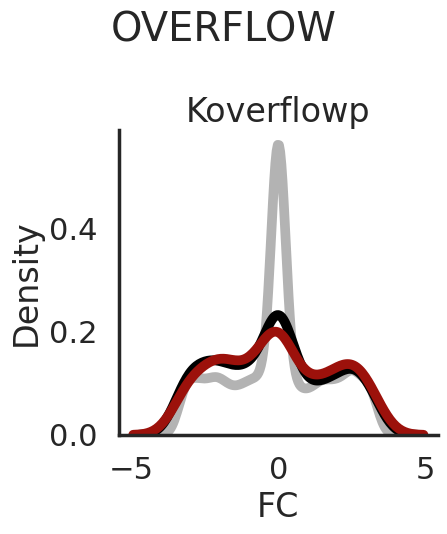

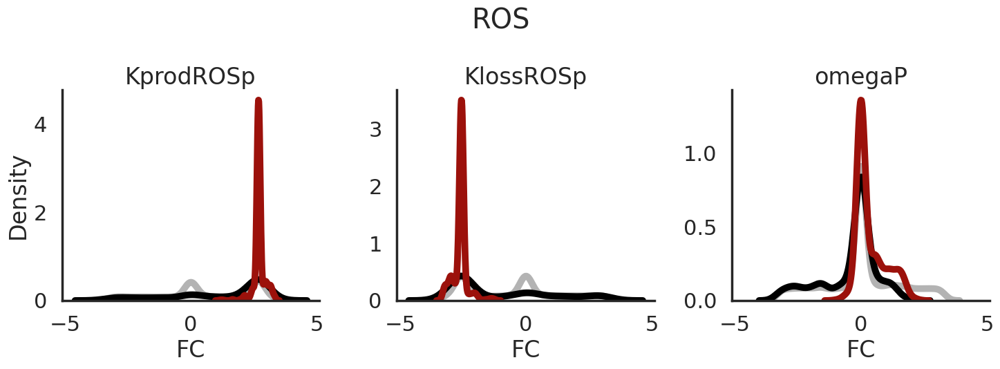

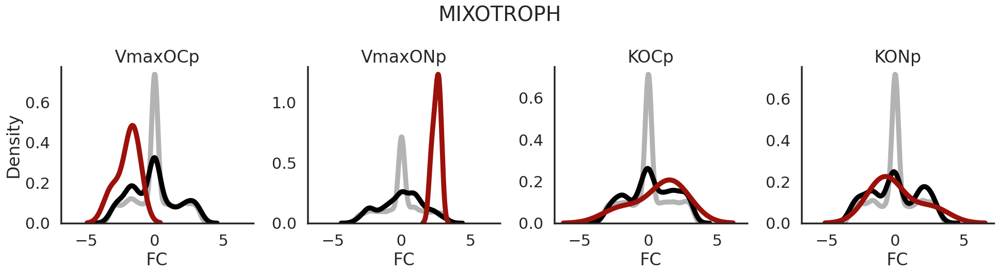

In [54]:
sns.set_context('poster')
min_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')

for model in morder:
    cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values(model, 'PRO')
    cur_pro_params_to_update = [p for p in cur_pro_params_to_update if p not in min_pro_params_to_update]
    if cur_pro_params_to_update:
        sns.displot(
            data=mparams_df.loc[ 
                ~mparams_df['FC'].isna() & 
                mparams_df['variable'].isin(cur_pro_params_to_update) &
                mparams_df['model'].isin([model]) 
    
                               ].reset_index(), 
            common_norm=False,
            col='variable', x='FC', #col_wrap=4, #order=gorder,
            hue='Versatile_STR', hue_order=vorder, palette=vpalette,
            lw=7,
            kind='kde',
            facet_kws=dict(sharey=False),
            col_order=cur_pro_params_to_update,
            legend=False,
        ).set_titles(col_template='{col_name}', row_template='{row_name}')
        plt.suptitle(model, y=1.1)

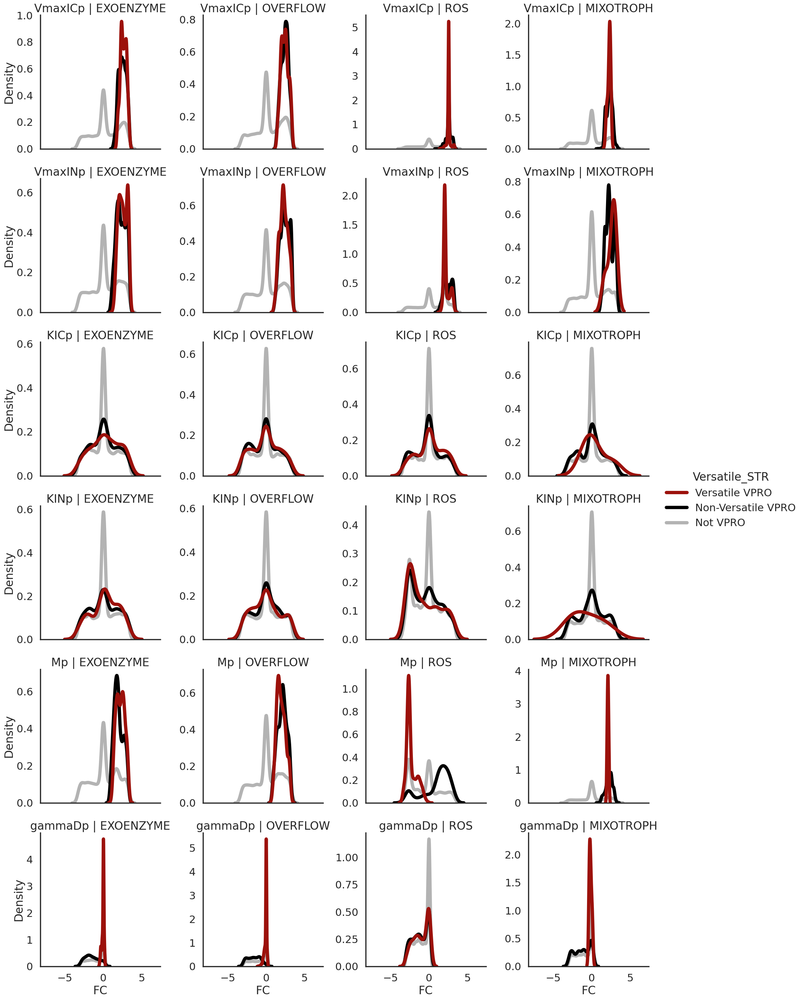

In [55]:
sns.set_context('poster')
cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    row='variable', x='FC', row_order=cur_pro_params_to_update,
    col='model', col_order=morder,
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=7,
    kind='kde',
    facet_kws=dict(sharey=False),
).set_titles(col_template='{col_name}', row_template='{row_name}')


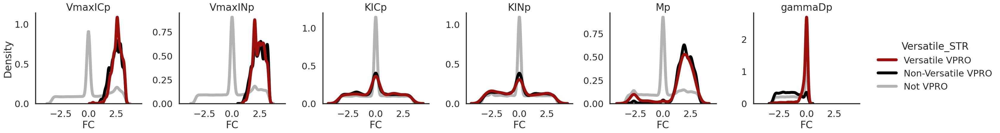

In [56]:
sns.set_context('poster')
cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='FC', col_order=cur_pro_params_to_update,
    #col='model', col_order=morder,
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=7,
    kind='kde',
    facet_kws=dict(sharey=False),
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [57]:
mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        ~mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].model.unique()

array(['MIXOTROPH', 'ROS', 'OVERFLOW', 'EXOENZYME-MIXOTROPH',
       'EXOENZYME-ROS-MIXOTROPH', 'EXOENZYME-ROS',
       'OVERFLOW-EXOENZYME-MIXOTROPH', 'OVERFLOW-EXOENZYME',
       'OVERFLOW-MIXOTROPH', 'OVERFLOW-ROS-EXOENZYME',
       'OVERFLOW-ROS-MIXOTROPH', 'OVERFLOW-ROS',
       'ROS-MIXOTROPH-OVERFLOW-EXOENZYME', 'ROS-MIXOTROPH'], dtype=object)

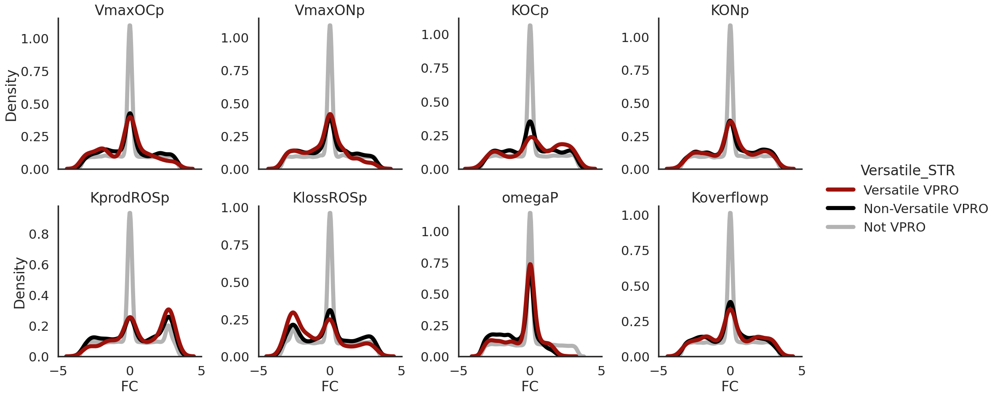

In [58]:
sns.set_context('poster')
cur_pro_params_to_update, min_pro_bounds, min_pro_log_params = get_param_tuning_values('MIN', 'PRO')
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        ~mparams_df['variable'].isin(cur_pro_params_to_update) #&
        #mparams_df['model'].isin([model]) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='FC', #col_order=cur_pro_params_to_update,
    #col='model', col_order=morder,
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=7,
    kind='kde', col_wrap=4,
    facet_kws=dict(sharey=False),
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [59]:
cur_pro_params_to_update

['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp']

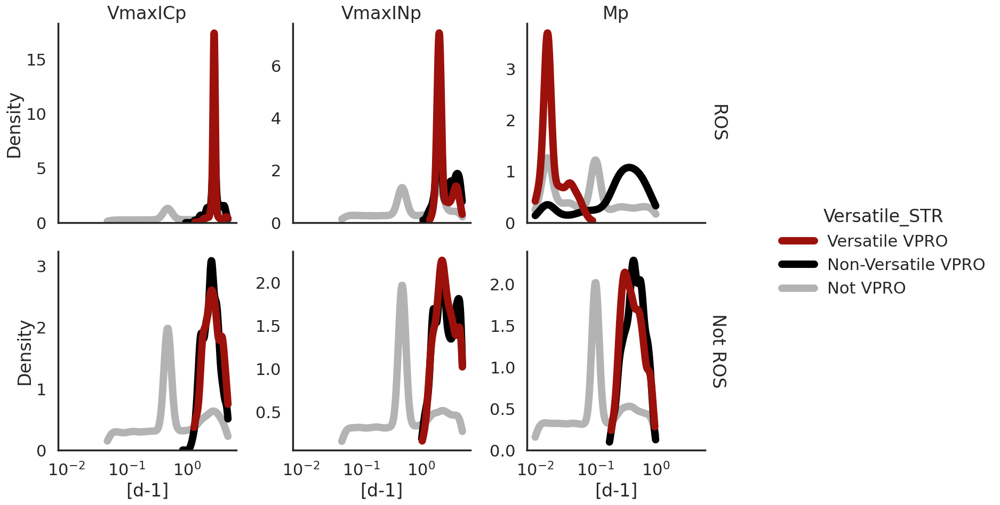

In [60]:
sns.set_context('poster')
porder = ['VmaxICp', 'VmaxINp', 'Mp', ] # 'gammaDp']
g = sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(porder) &
        mparams_df['model'].isin(morder) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='value', col_order=porder, log_scale=True, cut=0,
    row='model1', row_order=['ROS', 'Not ROS'],
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=10,
    kind='kde', 
    facet_kws=dict(sharey=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(xlabel='[d-1]')

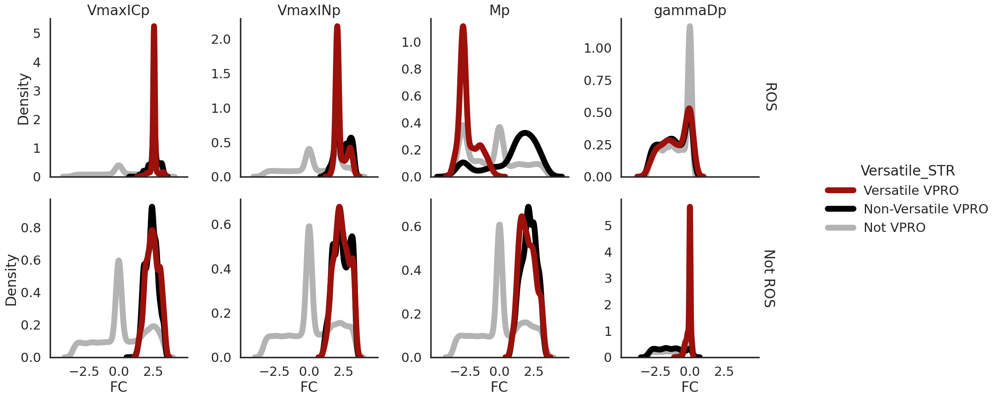

In [61]:
sns.set_context('poster')
porder = ['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp']
sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(porder) &
        mparams_df['model'].isin(morder) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='FC', col_order=porder,
    row='model1', row_order=['ROS', 'Not ROS'],
    hue='Versatile_STR', hue_order=vorder, palette=vpalette,
    lw=10,
    kind='kde', 
    facet_kws=dict(sharey=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [62]:
mparams_df['model2'] = mparams_df['model'] 
mparams_df.loc[mparams_df.Versatile_STR.isin(['Not VPRO']),  'model2'] = 'Not VPRO'


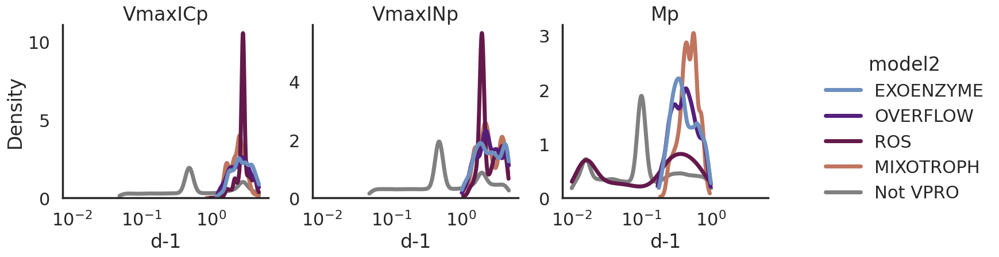

In [63]:
sns.set_context('poster')
porder = ['VmaxICp', 'VmaxINp', 'Mp', ]
g = sns.displot(
    data=mparams_df.loc[ 
        ~mparams_df['FC'].isna() & 
        mparams_df['variable'].isin(porder) &
        mparams_df['model'].isin(morder) 

                       ].reset_index(), 
    common_norm=False,
    col='variable', x='value', col_order=porder, log_scale=True, cut=0,
    #row='model1', row_order=['ROS', 'Not ROS'],
    hue='model2', hue_order=morder + ['Not VPRO'], palette=mpalette+['grey'],
    #row='model',
    lw=5,
    kind='kde', 
    facet_kws=dict(sharey=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(xlabel='d-1')

In [64]:
fmparams_df = mparams_df.pivot(
    index=id_vars + ['model1'],
    columns='variable', values='FC'
)

In [65]:
pmparams_df = mparams_df.pivot(
    index=id_vars + ['model1'],
    columns='variable', values='value'
)

In [66]:
pmparams_df = pmparams_df.reset_index()
fmparams_df = fmparams_df.reset_index()


In [67]:
pmparams_df.columns

Index(['run_id', 'idx', 'Phase', 'id', 'model', 'VPRO_nocluster',
       'Versatile_STR', 'model1', 'KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP'],
      dtype='object', name='variable')

In [68]:
pmparams_df.Versatile_STR.value_counts()

Versatile_STR
Not VPRO              213356
Non-Versatile VPRO     15489
Versatile VPRO          4242
Name: count, dtype: int64

In [69]:
pmparams_df['model2'] = pmparams_df['model'] 
pmparams_df.loc[pmparams_df.Versatile_STR.isin(['Not VPRO']),  'model2'] = 'Not VPRO'


In [70]:
pmparams_df

variable,run_id,idx,Phase,id,model,VPRO_nocluster,Versatile_STR,model1,KICp,KINp,...,Koverflowp,KprodROSp,Mp,VmaxICp,VmaxINp,VmaxOCp,VmaxONp,gammaDp,omegaP,model2
0,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,add,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,EXOENZYME,vpro_11_62_EXOENZYME_C1_0,Not VPRO,Not ROS,13.620813,0.020000,...,NaN,NaN,0.011690,1.390634,2.324335,NaN,NaN,0.800000,NaN,Not VPRO
1,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,add,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,EXOENZYME,vpro_11_62_EXOENZYME_C1_10,Not VPRO,Not ROS,68.961589,0.013556,...,NaN,NaN,0.029932,0.424656,0.174061,NaN,NaN,0.800000,NaN,Not VPRO
2,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,add,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,EXOENZYME,vpro_11_62_EXOENZYME_C1_11,Not VPRO,Not ROS,68.961589,0.146982,...,NaN,NaN,0.086043,4.773002,2.723233,NaN,NaN,0.806735,NaN,Not VPRO
3,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,add,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,EXOENZYME,vpro_11_62_EXOENZYME_C1_12,Not VPRO,Not ROS,68.961589,0.020000,...,NaN,NaN,0.023128,0.130039,2.723233,NaN,NaN,0.776375,NaN,Not VPRO
4,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,add,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,EXOENZYME,vpro_11_62_EXOENZYME_C1_13,Not VPRO,Not ROS,14.370488,0.020000,...,NaN,NaN,0.633166,4.773002,0.990311,NaN,NaN,0.702822,NaN,Not VPRO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233082,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,round2,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,ROS,vpro_2_19_33_ROS_C0_988_96_ROS,Not VPRO,ROS,5.498824,0.180365,...,NaN,0.000073,0.038570,2.833817,1.740478,NaN,NaN,0.137384,0.988331,Not VPRO
233083,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,round2,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,ROS,vpro_2_19_33_ROS_C0_988_97_ROS,Not VPRO,ROS,37.000000,0.005782,...,NaN,0.000514,0.038570,0.625814,1.740478,NaN,NaN,0.239732,0.481142,Not VPRO
233084,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,round2,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,ROS,vpro_2_19_33_ROS_C0_988_98_ROS,Not VPRO,ROS,37.000000,0.180365,...,NaN,0.000388,0.038570,0.128146,1.740478,NaN,NaN,0.239732,1.370657,Not VPRO
233085,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,round2,monte_round2_ponly_ROS_vpro_19_33_ROS_C0_988__...,ROS,vpro_2_19_33_ROS_C0_988_99_ROS,Not VPRO,ROS,37.000000,0.180365,...,NaN,0.001087,0.038570,0.049300,1.740478,NaN,NaN,0.188259,2.942400,Not VPRO


In [71]:
pmparams_df.columns

Index(['run_id', 'idx', 'Phase', 'id', 'model', 'VPRO_nocluster',
       'Versatile_STR', 'model1', 'KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP', 'model2'],
      dtype='object', name='variable')

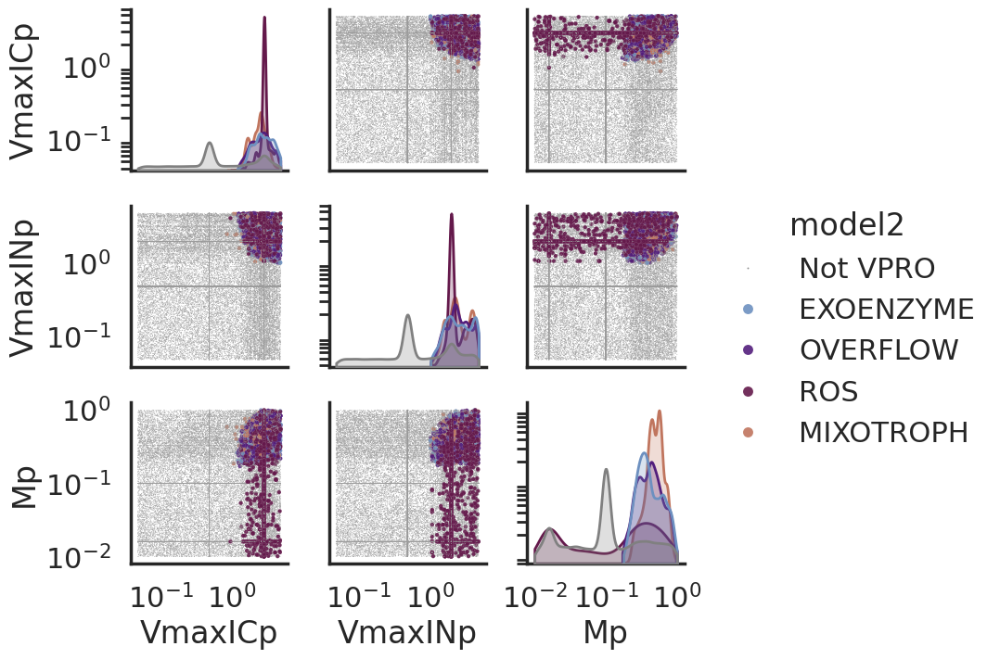

In [79]:
plt.rcParams["legend.markerscale"] = 2.5
data = pmparams_df.loc[pmparams_df.model.isin(morder)]
g = sns.pairplot(
    data=data,
    vars=['VmaxICp', 'VmaxINp', 'Mp'],
#    s=1,
    hue='model2', hue_order=['Not VPRO'] + morder , palette=['grey']+mpalette,
    plot_kws=dict(size=data['model2'], size_order=['Not VPRO'] + morder , sizes=[0.3, 10, 10,10,10], alpha=0.9),    
    diag_kws=dict(common_norm=False, log_scale=True, cut=0),
)

g.set(xscale='log', yscale='log')

In [73]:
sns.color_palette(vpalette)

[(0.611764705882353, 0.06666666666666667, 0.043137254901960784),
 (0.0, 0.0, 0.0),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

In [80]:
pmparams_df['isVPRO'] = pmparams_df.Versatile_STR.map({
    'Versatile VPRO' : 'VPRO', 'Positive VPRO' : 'VPRO', 'Negative VPRO' : 'VPRO', 'Not VPRO' : 'Not VPRO', 'VPRO': 'VPRO', 'Non-Versatile VPRO': 'VPRO'
})
# pmparams_df['isVERS'] = pmparams_df.Versatile_STR.map({
#     'Versatile VPRO' : 'VERS', 'Positive VPRO' : 'VPRO', 'Negative VPRO' : 'VPRO', 'Not VPRO' : 'Not VPRO', 'VPRO': 'VPRO',
#     'Non-Versatile VPRO': 'VPRO'
# })

pmparams_df['isVERS'] = pmparams_df.Versatile_STR
pmparams_df['isROS'] = 'Not ROS'
pmparams_df.loc[pmparams_df.model.isin(['ROS']),'isROS'] = 'ROS'


Text(0.5, 1.1, 'ROS vPros params')

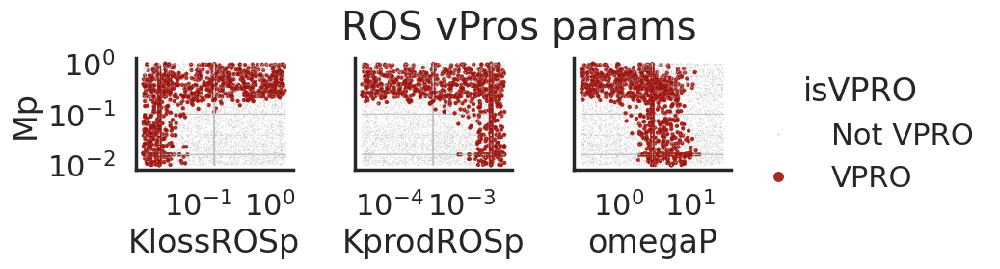

In [92]:
plt.rcParams["legend.markerscale"] = 2.5
data = pmparams_df.loc[pmparams_df.model.isin(['ROS'])]
g = sns.pairplot(
    data=data,
    x_vars=[# 'VmaxICp', 'VmaxINp', 
          #'Mp', 
          'KlossROSp',
        'KprodROSp','omegaP',
         ],
    y_vars=['Mp'],
    hue='isVPRO', hue_order=['Not VPRO', 'VPRO'] , palette=[vpalette[2], vpalette[0]],
    plot_kws=dict(size=data['isVPRO'], size_order=['Not VPRO', 'VPRO'] , sizes=[0.3,10], alpha=0.9),    
    
    diag_kws=dict(common_norm=False, log_scale=True, cut=0),
)
#plt.legend(False)
g.set(xscale='log', yscale='log')
plt.suptitle('ROS vPros params', y=1.1)

In [ ]:
vorder

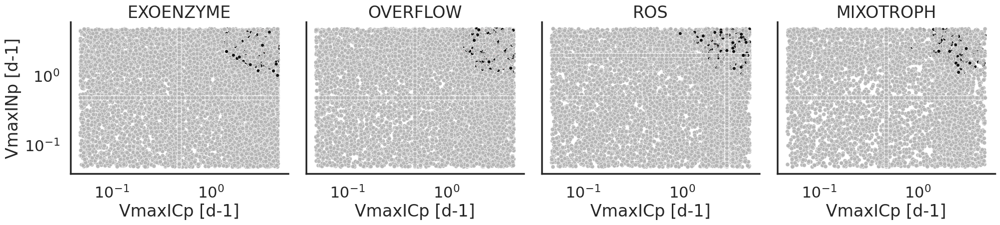

In [135]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('VmaxICp', 'VmaxINp')
sns.relplot(
    data=pmparams_df, 
    #common_norm=False,
    x=i, y=j,
    col='model', col_order=morder,
    hue='Versatile_STR', hue_order=list(reversed(vorder)), palette=list(reversed(vpalette)),
    size='Versatile_STR', size_order=list(reversed(vorder)), sizes=[35, 25, 1], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    xlabel=f'{i} [d-1]',
    ylabel=f'{j} [d-1]',
)
#plt.suptitle('Versatile VPRO')

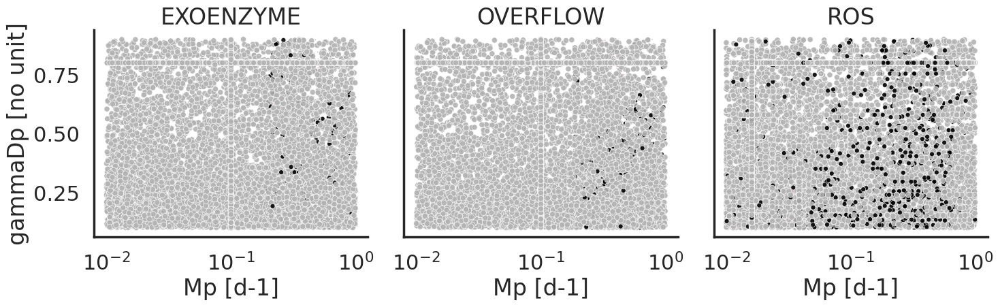

In [94]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'gammaDp')
sns.relplot(
    data=pmparams_df, 
    #common_norm=False,
    x=i, y=j,
    col='model', col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    #size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    size='Versatile_STR', size_order=reversed(vorder), sizes=[35, 25, 1], alpha=0.9,
    
    facet_kws=dict(margin_titles=True),
    legend=False,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', #yscale='log',
    xlabel=f'{i} [d-1]',
    ylabel=f'{j} [no unit]',
)


/tmp/ipykernel_1266210/794845391.py:5: UserWarning: The sizes list has more values (4) than needed (3), which may not be intended.
  sns.relplot(


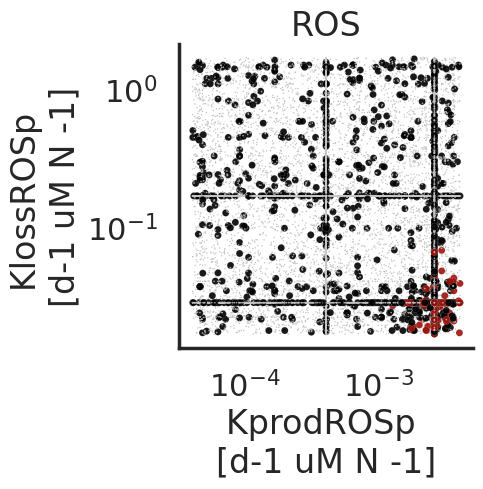

In [95]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('KprodROSp', 'KlossROSp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    x=i, y=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    xlabel=f'{i} \n[d-1 uM N -1]',
    ylabel=f'{j} \n[d-1 uM N -1]',
)


/tmp/ipykernel_1266210/3303102295.py:5: UserWarning: The sizes list has more values (4) than needed (3), which may not be intended.
  sns.relplot(


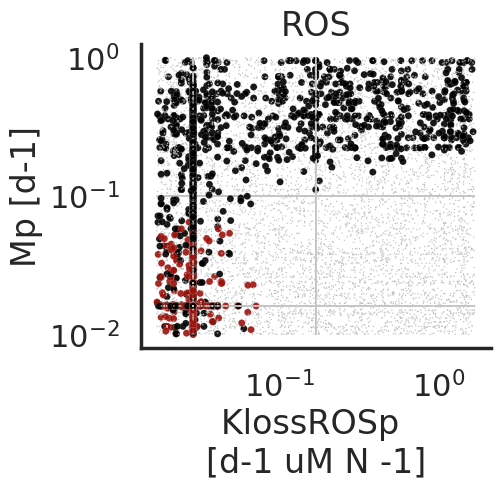

In [96]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'KlossROSp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    y=i, x=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False, aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    ylabel=f'{i} [d-1]',
    xlabel=f'{j} \n[d-1 uM N -1]',
)


/tmp/ipykernel_1266210/2423468876.py:5: UserWarning: The sizes list has more values (4) than needed (3), which may not be intended.
  sns.relplot(


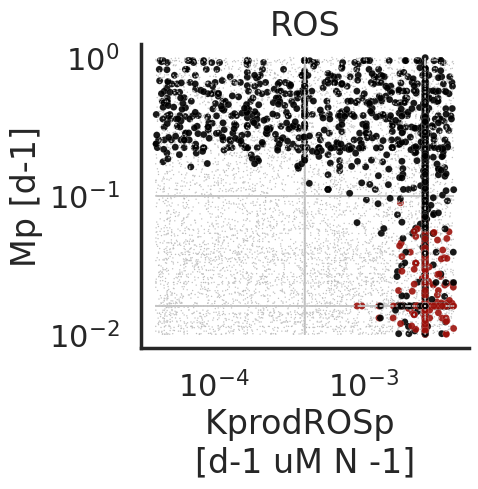

In [97]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'KprodROSp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    y=i, x=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    ylabel=f'{i} [d-1]',
    xlabel=f'{j} \n[d-1 uM N -1]',
)


/tmp/ipykernel_1266210/275493249.py:5: UserWarning: The sizes list has more values (4) than needed (3), which may not be intended.
  sns.relplot(


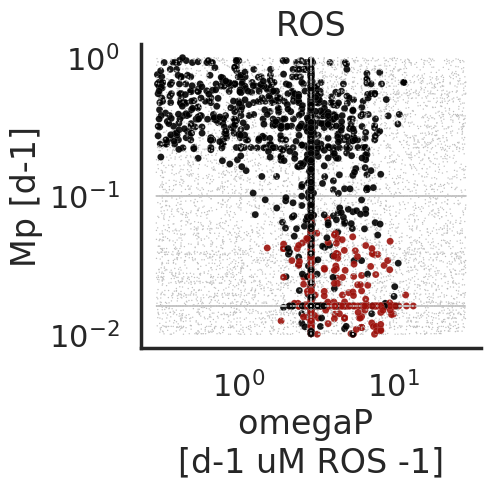

In [98]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'omegaP')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['ROS'])], 
    #common_norm=False,
    y=i, x=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    ylabel=f'{i} [d-1]',
    xlabel=f'{j} \n[d-1 uM ROS -1]',
)


/tmp/ipykernel_1266210/4101530783.py:5: UserWarning: The sizes list has more values (4) than needed (3), which may not be intended.
  sns.relplot(


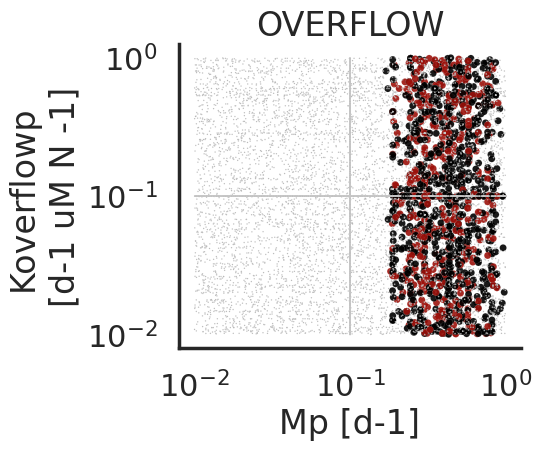

In [99]:
sns.set_context('poster')
 
#for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp')]:
i,j = ('Mp', 'Koverflowp')
sns.relplot(
    data=pmparams_df.loc[pmparams_df.model.isin(['OVERFLOW'])], 
    #common_norm=False,
    x=i, y=j,
    col='model', #col_order=morder[:-1],
    hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
    size='Versatile_STR', size_order=reversed(vorder), sizes=[1, 25, 25,35], alpha=0.9,
    facet_kws=dict(margin_titles=True),
    legend=False,aspect=1.1,
).set_titles(
    col_template='{col_name}', row_template='{row_name}'
).set(
    xscale='log', yscale='log',
    xlabel=f'{i} [d-1]',
    ylabel=f'{j} \n[d-1 uM N -1]',
)


In [100]:
fmparams_df.columns

Index(['run_id', 'idx', 'Phase', 'id', 'model', 'VPRO_nocluster',
       'Versatile_STR', 'model1', 'KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP'],
      dtype='object', name='variable')

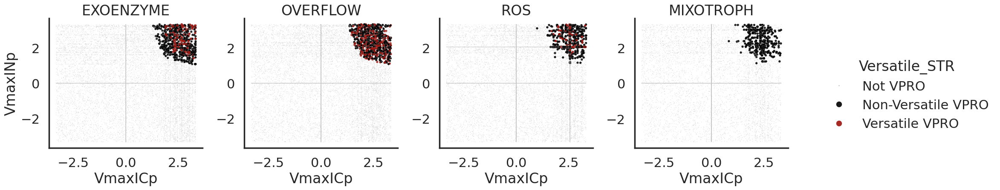

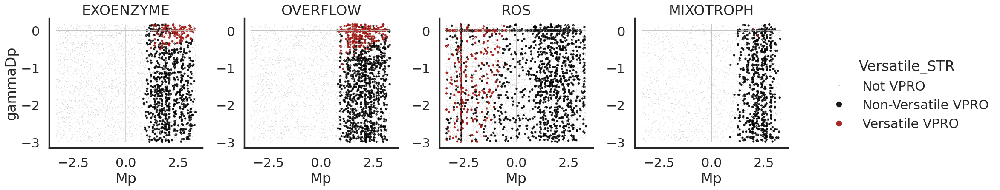

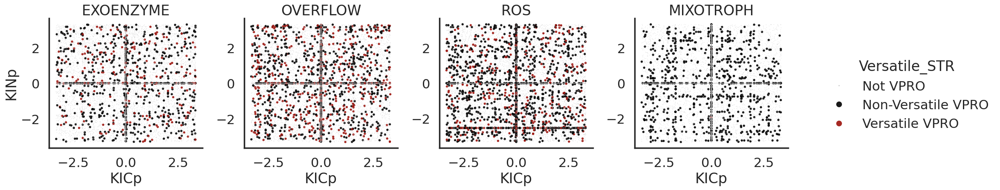

In [101]:
sns.set_context('poster')
 
for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp'), ('KICp', 'KINp')]:
    sns.relplot(
        data=fmparams_df, 
        #common_norm=False,
        x=i, y=j,
        col='model', col_order=morder,
        hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
        size='Versatile_STR', size_order=reversed(vorder), sizes=dict(zip(vorder, [15, 15,.5])), alpha=0.9,
        facet_kws=dict(sharey=False, margin_titles=True),
    ).set_titles(col_template='{col_name}', row_template='{row_name}')


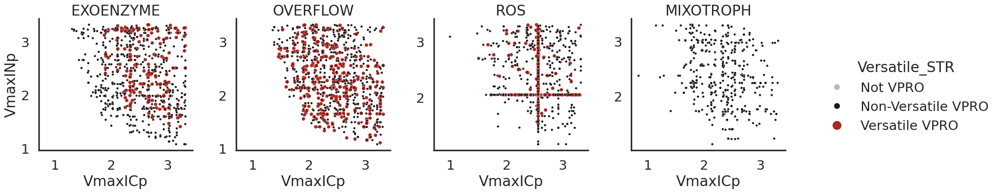

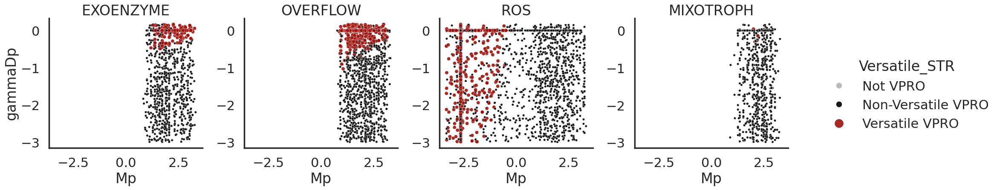

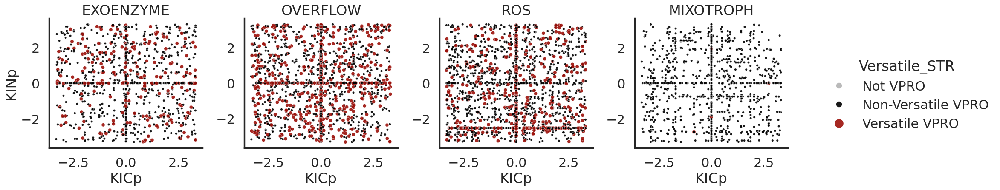

In [102]:
sns.set_context('poster')
 
for i,j in [('VmaxICp', 'VmaxINp'), ('Mp', 'gammaDp'), ('KICp', 'KINp')]:
    sns.relplot(
        data=fmparams_df.loc[~fmparams_df.Versatile_STR.isin(['Not VPRO'])], 
        #common_norm=False,
        x=i, y=j,
        col='model', col_order=morder,
        hue='Versatile_STR', hue_order=reversed(vorder), palette=reversed(vpalette),
        size='Versatile_STR', size_order=reversed(vorder), sizes=dict(zip(vorder, [35, 15,15,1])), alpha=0.9,
        facet_kws=dict(sharey=False, margin_titles=True),
    ).set_titles(col_template='{col_name}', row_template='{row_name}')


In [103]:
mparams_df['isVPRO'] = mparams_df.Versatile_STR.map({
    'Versatile VPRO' : 'VPRO', 'Positive VPRO' : 'VPRO', 'Negative VPRO' : 'VPRO', 'Not VPRO' : 'Not VPRO', 'VPRO': 'VPRO', 'Non-Versatile VPRO': 'VPRO'
})
mparams_df['isVERS'] = mparams_df.Versatile_STR

mparams_df['isROS'] = 'Not ROS'
mparams_df.loc[mparams_df.model.isin(['ROS']),'isROS'] = 'ROS'


In [104]:
pmparams_df.loc[pmparams_df.model.isin(morder)].groupby(['isVPRO', 'isROS'])[['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std', 'min', 'max']).T

isVPRO         Not VPRO                VPRO          
isROS           Not ROS       ROS   Not ROS       ROS
variable                                             
VmaxICp  mean  1.109417  1.432331  2.648190  2.904213
         std   1.184552  1.270077  0.825893  0.629362
         min   0.048023  0.048030  0.854472  0.956170
         max   4.798804  4.799506  4.796130  4.792272
VmaxINp  mean  1.064333  1.237950  2.658696  2.588631
         std   1.181490  1.142384  1.031044  0.917715
         min   0.048006  0.048001  1.013443  1.065423
         max   4.799820  4.799674  4.797081  4.762279
Mp       mean  0.209576  0.153250  0.462845  0.255281
         std   0.229030  0.217142  0.174871  0.252274
         min   0.010004  0.010002  0.170399  0.010028
         max   0.998792  0.999899  0.993299  0.996536
gammaDp  mean  0.512366  0.508514  0.445788  0.449784
         std   0.272808  0.272148  0.261608  0.260881
         min   0.100010  0.100003  0.100050  0.100159
         max   0.899984  0.899868  0.899727  0.897218

In [105]:
pmparams_df.loc[pmparams_df.model.isin(['MIXOTROPH'])].groupby(['isVPRO', ])[['VmaxOCp', 'VmaxONp', ]].agg(['mean', 'std', 'min', 'max'])

variable   VmaxOCp                                 VmaxONp            \
              mean       std       min       max      mean       std   
isVPRO                                                                 
Not VPRO  0.271771  0.327533  0.016007  1.599179  0.163160  0.190081   
VPRO      0.289836  0.375037  0.016027  1.594672  0.167405  0.179784   

variable                      
               min       max  
isVPRO                        
Not VPRO  0.009601  0.959563  
VPRO      0.009804  0.959771

In [106]:
pmparams_df.loc[pmparams_df.model.isin(['MIXOTROPH'])][['VmaxOCp', 'VmaxONp', ]].agg(['mean', 'std', 'min', 'max']).T

,mean,std,min,max
variable,,,,
VmaxOCp,0.273429,0.332203,0.016007,1.599179
VmaxONp,0.163549,0.189157,0.009601,0.959771


In [107]:
pmparams_df.loc[pmparams_df.model.isin(morder)][['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std', 'min', 'max']).T

,mean,std,min,max
variable,,,,
VmaxICp,1.341376,1.263846,0.048023,4.799506
VmaxINp,1.247667,1.232160,0.048001,4.799820
Mp,0.208329,0.233517,0.010002,0.999899
gammaDp,0.505732,0.272247,0.100003,0.899984


In [108]:
pmparams_df.loc[pmparams_df.model.isin(morder)].groupby(['isVERS'])[['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std'])

variable             VmaxICp             VmaxINp                  Mp  \
                        mean       std      mean       std      mean   
isVERS                                                                 
Non-Versatile VPRO  2.719931  0.779119  2.655267  1.009155  0.418808   
Not VPRO            1.212112  1.221687  1.119548  1.171978  0.191663   
Versatile VPRO      2.811557  0.737801  2.555239  0.925753  0.279184   

variable                       gammaDp            
                         std      mean       std  
isVERS                                            
Non-Versatile VPRO  0.213972  0.390210  0.240985  
Not VPRO            0.226838  0.511141  0.272602  
Versatile VPRO      0.246273  0.653908  0.225570

In [109]:
pmparams_df.loc[pmparams_df.model.isin(morder)].groupby(['isROS', 'isVERS', ])[['VmaxICp', 'VmaxINp', 'Mp', 'gammaDp' ]].agg(['mean', 'std'])

variable                     VmaxICp             VmaxINp                  Mp  \
                                mean       std      mean       std      mean   
isROS   isVERS                                                                 
Not ROS Non-Versatile VPRO  2.613777  0.808661  2.660640  1.039008  0.468718   
        Not VPRO            1.109417  1.184552  1.064333  1.181490  0.209576   
        Versatile VPRO      2.780367  0.877049  2.651231  1.000484  0.440287   
ROS     Non-Versatile VPRO  2.917329  0.678380  2.645275  0.951388  0.325999   
        Not VPRO            1.432331  1.270077  1.237950  1.142384  0.153250   
        Versatile VPRO      2.861143  0.428591  2.402632  0.769243  0.023064   

variable                               gammaDp            
                                 std      mean       std  
isROS   isVERS                                            
Not ROS Non-Versatile VPRO  0.173783  0.362117  0.225451  
        Not VPRO            0.229030  0.512366  0.272808  
        Versatile VPRO      0.177300  0.767154  0.076801  
ROS     Non-Versatile VPRO  0.248083  0.442449  0.259592  
        Not VPRO            0.217142  0.508514  0.272148  
        Versatile VPRO      0.013347  0.473871  0.263904

In [110]:
pmparams_df.loc[pmparams_df.model.isin(['ROS'])].groupby(['isVERS'])[[
    'KlossROSp',
        'KprodROSp',  'omegaP'
 ]].agg(['mean', 'std'])

variable           KlossROSp           KprodROSp              omegaP          
                        mean       std      mean       std      mean       std
isVERS                                                                        
Non-Versatile VPRO  0.235981  0.385895  0.001658  0.001145  2.830769  1.710204
Not VPRO            0.252124  0.353835  0.001182  0.001112  4.902021  5.730271
Versatile VPRO      0.028317  0.006156  0.002691  0.000395  4.142842  2.056878

In [111]:
pmparams_df.loc[pmparams_df.model.isin(['OVERFLOW'])].groupby(['isVERS'])[[
    'Koverflowp',
 ]].agg(['mean', 'std'])

variable           Koverflowp          
                         mean       std
isVERS                                 
Non-Versatile VPRO   0.195974  0.244965
Not VPRO             0.188818  0.226418
Versatile VPRO       0.207108  0.251406

In [112]:
df.pivot_table(columns='Versatile_STR', index='model', values='idx', aggfunc='count')

Versatile_STR,Non-Versatile VPRO,Not VPRO,Versatile VPRO
model,,,
EXOENZYME,768.0,15737.0,235.0
EXOENZYME-MIXOTROPH,885.0,12077.0,136.0
EXOENZYME-ROS,591.0,12132.0,229.0
EXOENZYME-ROS-MIXOTROPH,1087.0,12520.0,390.0
MIN,673.0,13638.0,NaN
MIXOTROPH,1235.0,12257.0,4.0
OVERFLOW,989.0,15312.0,540.0
OVERFLOW-EXOENZYME,857.0,13792.0,279.0
OVERFLOW-EXOENZYME-MIXOTROPH,1156.0,12552.0,284.0


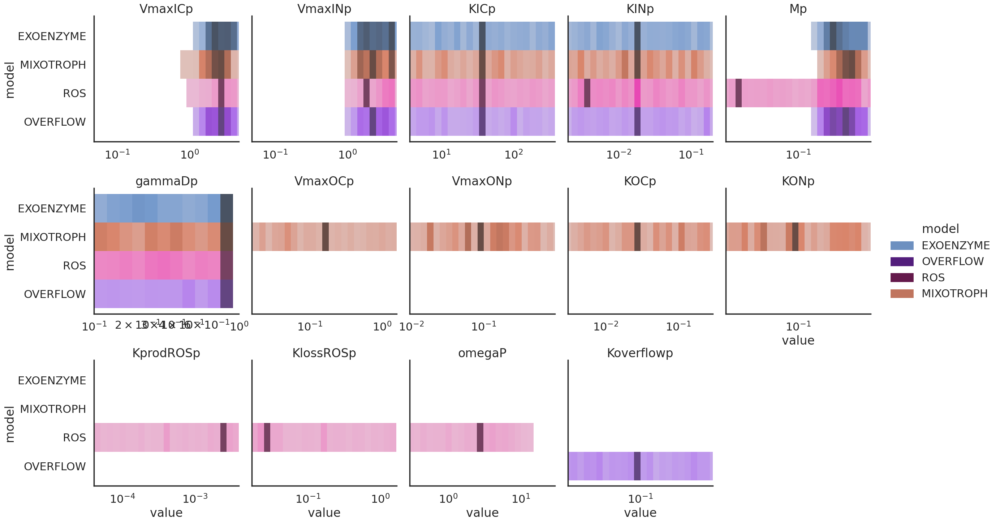

In [113]:
g = sns.displot(
    data=mparams_df.loc[mparams_df.isVPRO.isin(['VPRO']) & mparams_df.model.isin(morder)  ],
    hue='model', 
    #order=morder,
    hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=5,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
           
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1))
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

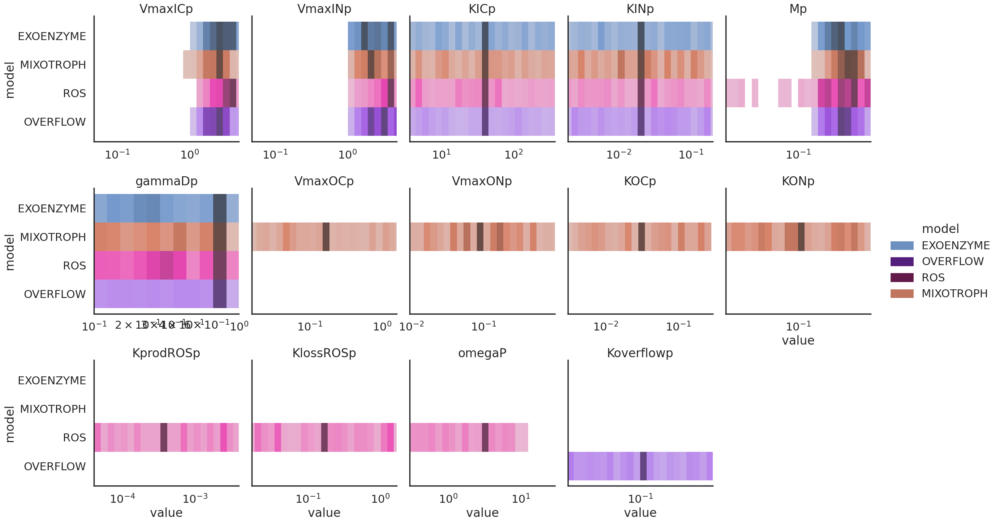

In [114]:
g = sns.displot(
    data=mparams_df.loc[mparams_df.isVPRO.isin(['VPRO']) & mparams_df.model.isin(morder) & mparams_df.Phase.isin(['init', 'extend']) ],
    hue='model', 
    #order=morder,
    hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=5,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
           
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1))
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

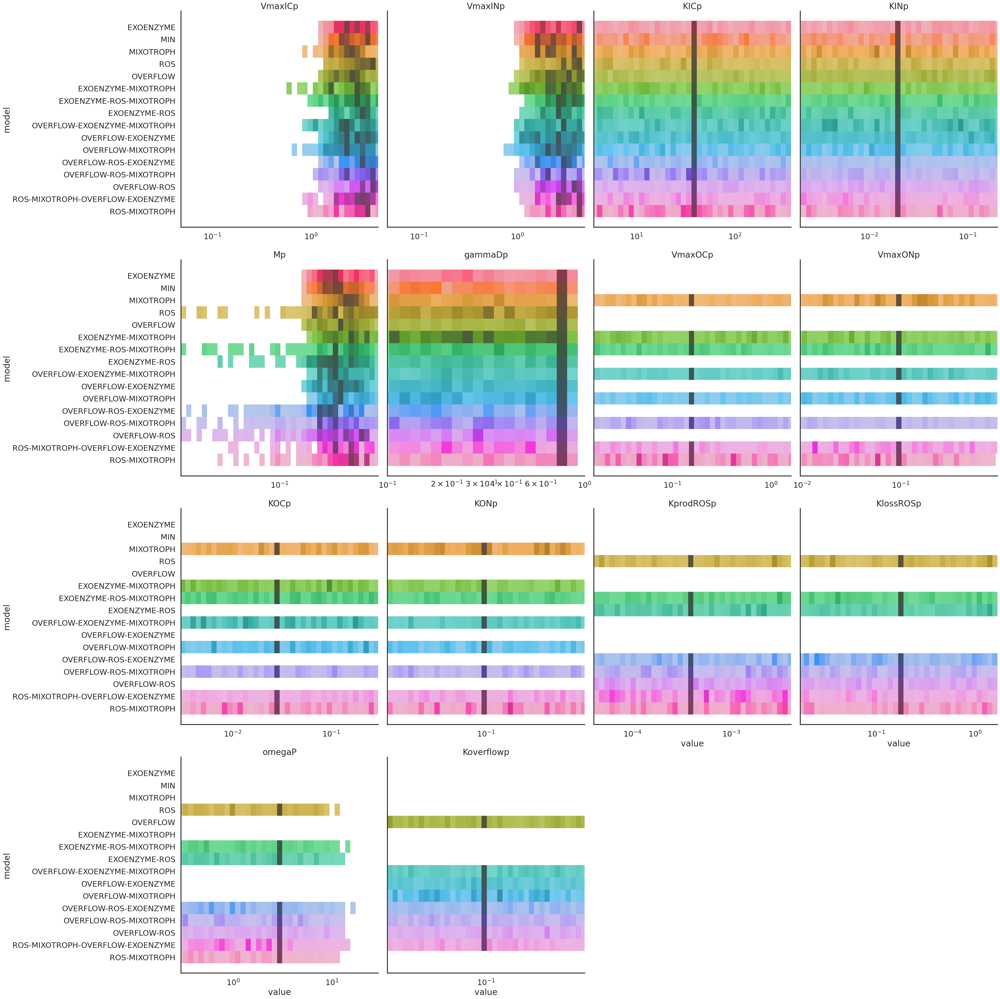

In [115]:
g = sns.displot(
    data=mparams_df.loc[
        mparams_df.isVPRO.isin(['VPRO']) &# mparams_df.model.isin(morder) & 
        mparams_df.Phase.isin(['init', 'extend']) 
    
    ],
    hue='model', 
    #order=morder,
    #hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=4,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
 height=10,          legend=False,
    
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1), xscale='log', xticks=[1e-1, 1e0])
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

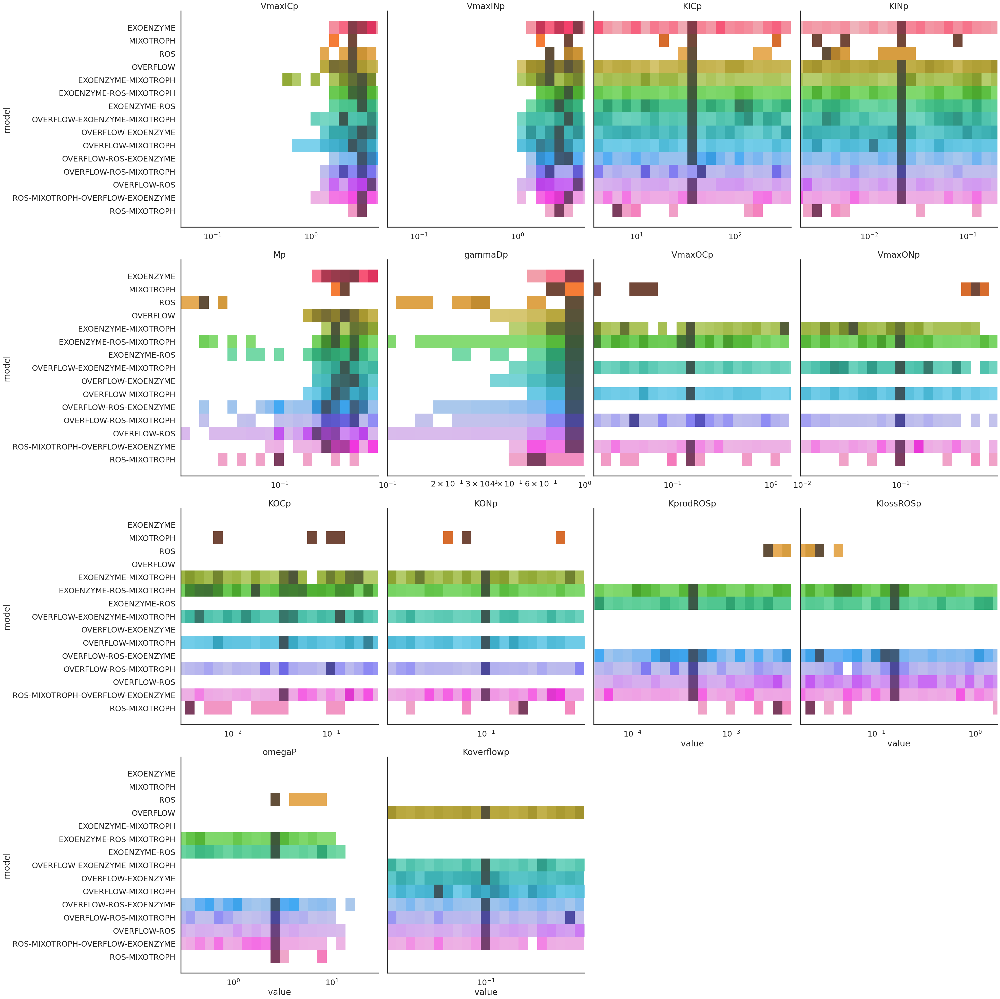

In [116]:
g = sns.displot(
    data=mparams_df.loc[
        mparams_df.Versatile_STR.isin(['Versatile VPRO']) & #mparams_df.model.isin(morder) & 
        mparams_df.Phase.isin(['init', 'extend']) 
    
    ],
    hue='model', 
    #order=morder,
    #hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=4,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
 height=10,          legend=False,
    
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1), xscale='log', xticks=[1e-1, 1e0])
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

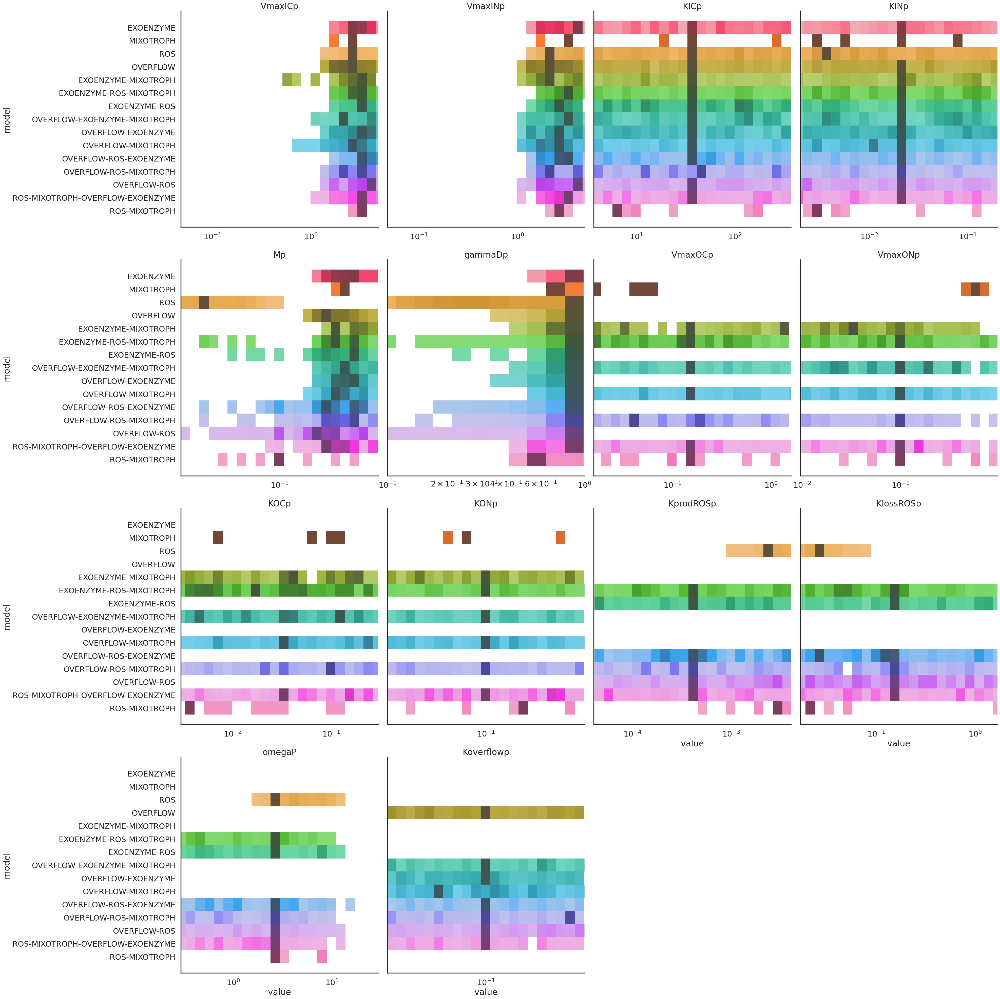

In [117]:
g = sns.displot(
    data=mparams_df.loc[
        mparams_df.Versatile_STR.isin(['Versatile VPRO']) #& #mparams_df.model.isin(morder) & 
       # mparams_df.Phase.isin(['init', 'extend']) 
    
    ],
    hue='model', 
    #order=morder,
    #hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=4,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
 height=10,          legend=False,
    
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1), xscale='log', xticks=[1e-1, 1e0])
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

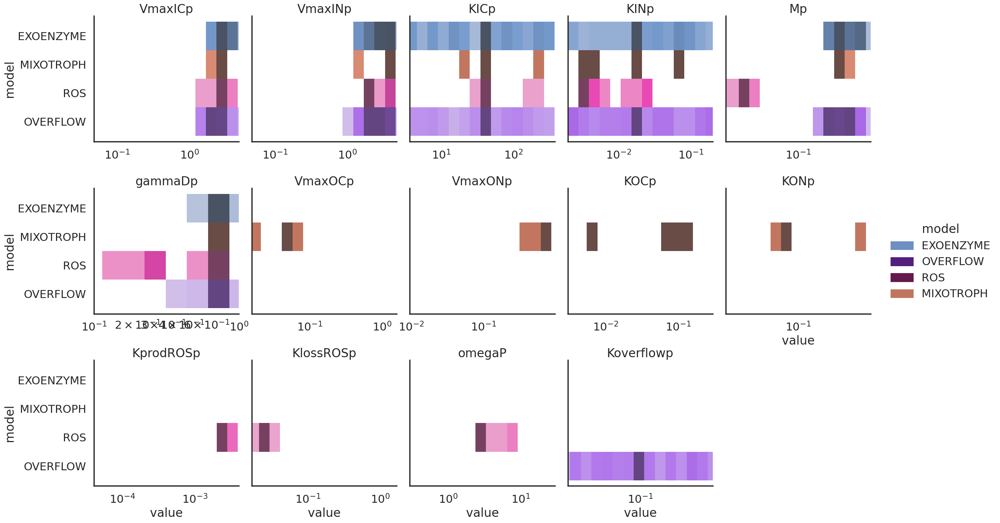

In [118]:
g = sns.displot(
    data=mparams_df.loc[
        mparams_df.Versatile_STR.isin(['Versatile VPRO']) & mparams_df.model.isin(morder) & 
        mparams_df.Phase.isin(['init', 'extend']) 
    
    ],
    hue='model', 
    #order=morder,
    hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=5,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
           
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1), xscale='log', xticks=[1e-1, 1e0])
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

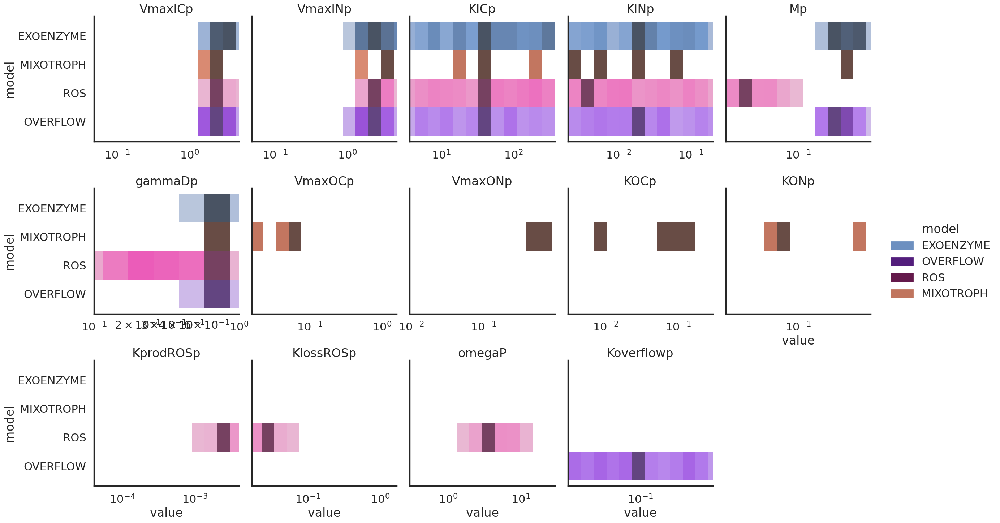

In [119]:
g = sns.displot(
    data=mparams_df.loc[
        mparams_df.Versatile_STR.isin(['Versatile VPRO']) & mparams_df.model.isin(morder) #& 
        #mparams_df.Phase.isin(['init', 'extend']) 
    
    ],
    hue='model', 
    #order=morder,
    hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=5,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
           
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1), xscale='log', xticks=[1e-1, 1e0])
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

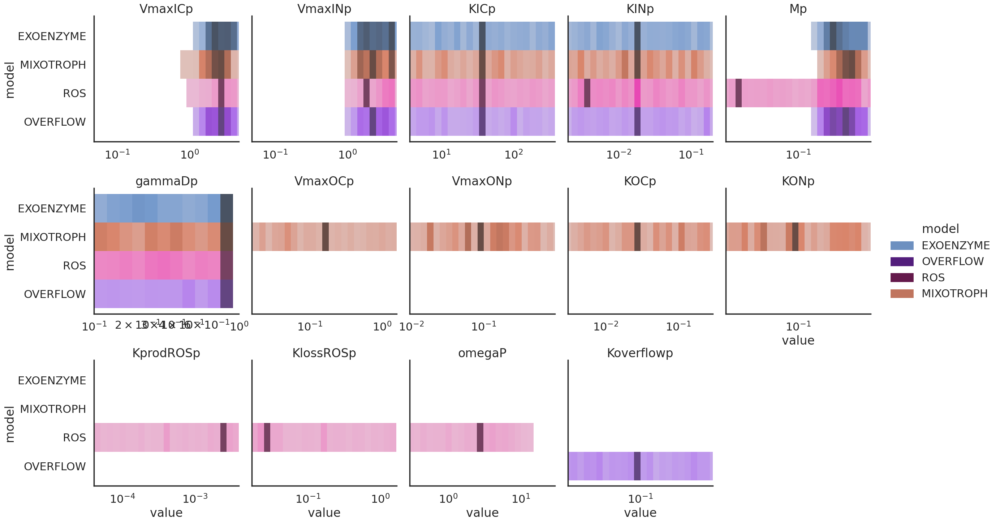

In [120]:
g = sns.displot(
    data=mparams_df.loc[
        mparams_df.isVPRO.isin(['VPRO']) & mparams_df.model.isin(morder) #& 
        #mparams_df.Phase.isin(['init', 'extend']) 
    
    ],
    hue='model', 
    #order=morder,
    hue_order=morder, palette=mpalette,
    y='model', x='value', 
    col='variable', col_wrap=5,
    facet_kws=dict(sharex=False),
    common_norm=False, log_scale=True,
           
)
g.set_titles(col_template='{col_name}')
for col_val, ax in g.axes_dict.items():
    if col_val == 'gammaDp':
        ax.set(xlim=(0.1, 1), xscale='log', xticks=[1e-1, 1e0])
    else:
        ax.set(xlim=(pmparams_df[col_val].min(), pmparams_df[col_val].max()), xscale='log')

In [121]:
pmparams_df['gammaDp'].max()

0.8999835126272105

In [122]:
pmparams_df.loc[pmparams_df.isVPRO.isin(['VPRO'])].model.value_counts()

model
ROS                                 2099
OVERFLOW-MIXOTROPH                  1662
OVERFLOW                            1529
EXOENZYME-ROS-MIXOTROPH             1477
OVERFLOW-EXOENZYME-MIXOTROPH        1440
OVERFLOW-ROS-MIXOTROPH              1370
ROS-MIXOTROPH-OVERFLOW-EXOENZYME    1267
MIXOTROPH                           1239
OVERFLOW-EXOENZYME                  1136
OVERFLOW-ROS                        1070
OVERFLOW-ROS-EXOENZYME              1026
EXOENZYME-MIXOTROPH                 1021
EXOENZYME                           1003
ROS-MIXOTROPH                        899
EXOENZYME-ROS                        820
MIN                                  673
Name: count, dtype: int64

In [123]:
pmparams_df[['Versatile_STR']].value_counts()

Versatile_STR     
Not VPRO              213356
Non-Versatile VPRO     15489
Versatile VPRO          4242
Name: count, dtype: int64

In [124]:
fmparams_df.columns

Index(['run_id', 'idx', 'Phase', 'id', 'model', 'VPRO_nocluster',
       'Versatile_STR', 'model1', 'KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP'],
      dtype='object', name='variable')

In [125]:
from scipy.stats import pearsonr
data = fmparams_df.loc[~fmparams_df.Versatile_STR.isin(['Not VPRO']),
['KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP']
]
corr = data.corr(method=lambda x, y: pearsonr(x, y)[0]) 

# this computes the p-values
pvalues = data.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(len(data.columns)) 
corr, pvalues

(variable        KICp      KINp      KOCp      KONp  KlossROSp  Koverflowp  \
 variable                                                                    
 KICp        1.000000  0.019936  0.034164 -0.012833   0.005263    0.006464   
 KINp        0.019936  1.000000 -0.024298 -0.011427   0.068280    0.007533   
 KOCp        0.034164 -0.024298  1.000000 -0.044868  -0.019834   -0.062253   
 KONp       -0.012833 -0.011427 -0.044868  1.000000  -0.022839    0.056920   
 KlossROSp   0.005263  0.068280 -0.019834 -0.022839   1.000000   -0.013743   
 Koverflowp  0.006464  0.007533 -0.062253  0.056920  -0.013743    1.000000   
 KprodROSp   0.067075 -0.082568  0.002960  0.004577  -0.256369    0.020620   
 Mp         -0.025457  0.057932  0.023619 -0.021847   0.437782   -0.017799   
 VmaxICp     0.019247  0.006025 -0.008672 -0.028191   0.009168    0.017653   
 VmaxINp     0.011293  0.008466  0.007474 -0.008370   0.053537   -0.010507   
 VmaxOCp    -0.021157  0.016224 -0.003689 -0.001710  -0.019504  

In [126]:
def convert_pvalue_to_asterisks(x):
    pvalue = x.adj_pval
    r = x.pearsonr
    if pvalue <= 0.001:
        return f"{r:.1f}\n***"
    elif pvalue <= 0.01:
        return f"{r:.1f}\n**"
    elif pvalue <= 0.05:
        return f"{r:.1f}\n*"
    return f"{r:.1f}"



In [127]:
from itertools import combinations
from scipy.stats import pearsonr ,spearmanr
from statsmodels.stats import multitest

corr_cols = ['KICp', 'KINp', 'KOCp', 'KONp', 'KlossROSp',
       'Koverflowp', 'KprodROSp', 'Mp', 'VmaxICp', 'VmaxINp', 'VmaxOCp',
       'VmaxONp', 'gammaDp', 'omegaP']

def _compute_corr_pair(x1, c1, c2):
    pearsonres = pearsonr(x1[c1], x1[c2])
    spearmanres = spearmanr(x1[c1], x1[c2])
    return {
        'param1': c1,
        'param2': c2,
        'pearsonr': pearsonres.statistic,
        'pvalue': pearsonres.pvalue,
    }


def _compute_corr(x):
    x1  =x[corr_cols].dropna(axis='columns')
    res = pd.DataFrame(_compute_corr_pair(x1, c1, c2) for c1, c2 in  combinations(x1.columns, r=2))
    # TODO padj
    # Calculate adjusted p-values
    reject, adj_pvals, _, _ = multitest.multipletests(res['pvalue'], method='fdr_bh')

    # Add adjusted p-value to the DataFrame
    res['adj_pval'] = adj_pvals
    
    return res
    

correlation_df = pmparams_df.loc[~pmparams_df.Versatile_STR.isin(['Not VPRO'])].groupby('model').apply(_compute_corr)
correlation_df = correlation_df.reset_index()
correlation_df['type'] = 'all VPRO'


In [128]:
correlation_df['adj_pval_asterisks'] =  correlation_df.apply(convert_pvalue_to_asterisks, axis=1)



In [129]:
correlation_df.adj_pval_asterisks

0          -0.0
1          -0.0
2           0.0
3           0.0
4           0.0
         ...   
767      0.1\n*
768         0.0
769     -0.1\n*
770         0.0
771    0.1\n***
Name: adj_pval_asterisks, Length: 772, dtype: object

Text(0.5, 0.98, 'pearson correlation (vPros)')

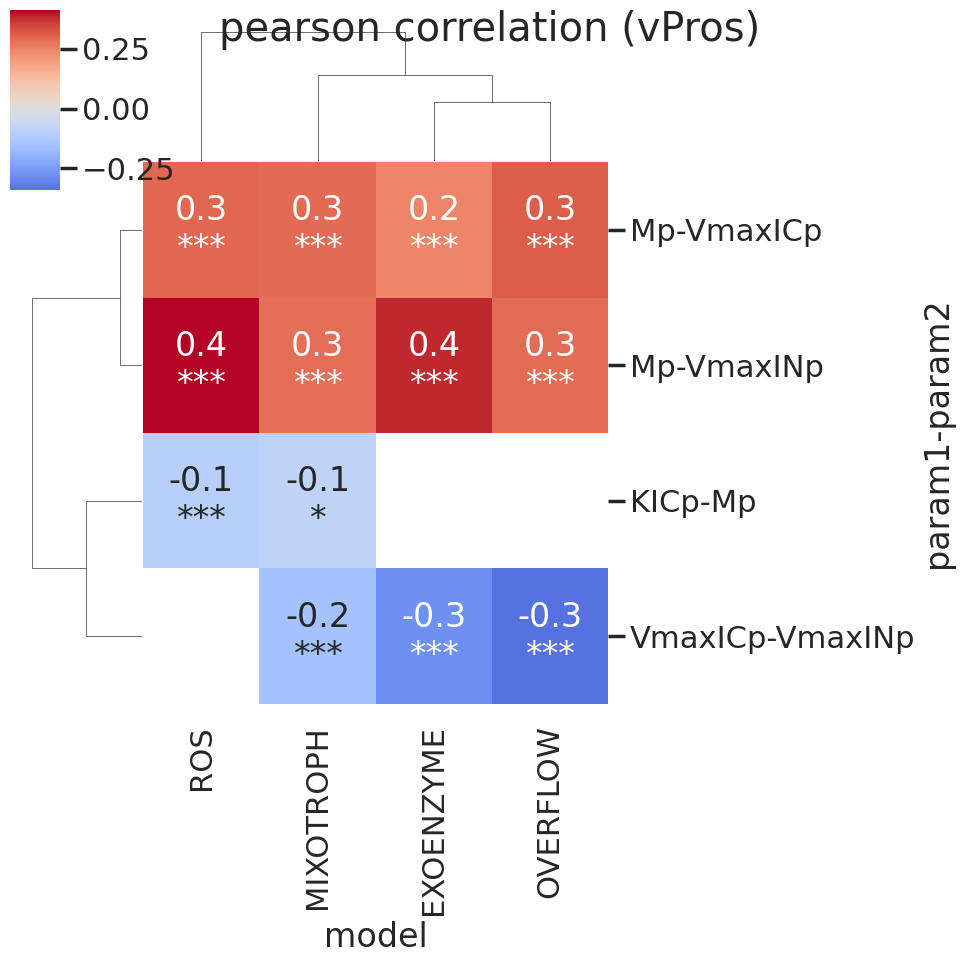

In [130]:
sns.set_context('poster')
filtered_correlation_df = correlation_df.loc[correlation_df.adj_pval.le(0.05) & correlation_df.model.isin(morder)
]

tdf = filtered_correlation_df.pivot_table(values='pearsonr', columns='model', index=['param1', 'param2']) #.dropna(),
annotdf = filtered_correlation_df.pivot_table(values='adj_pval_asterisks', columns='model', index=['param1', 'param2'], aggfunc='first') #.dropna(),

mask= tdf.isna().sum(axis=1).le(2)

sns.clustermap(
    tdf.loc[mask].fillna(0),
    mask = tdf.loc[mask].isna(),
    cmap='coolwarm', annot=annotdf.loc[mask], fmt= '',
    center=0, #vmax=1, vmin=-1,
)
plt.xlabel('')
plt.ylabel('')
plt.suptitle('pearson correlation (vPros)')



In [131]:
filtered_correlation_df.loc[
    filtered_correlation_df.param1.isin(['VmaxICp','VmaxINp']) &
    filtered_correlation_df.param2.isin(['VmaxICp','VmaxINp']) 
]

,model,level_1,param1,param2,pearsonr,pvalue,adj_pval,type,adj_pval_asterisks
12,EXOENZYME,12,VmaxICp,VmaxINp,-0.275587,6.127397e-19,4.595548e-18,all VPRO,-0.3\n***
224,MIXOTROPH,35,VmaxICp,VmaxINp,-0.153473,5.670017e-08,6.378769e-07,all VPRO,-0.2\n***
252,OVERFLOW,18,VmaxICp,VmaxINp,-0.340034,1.081322e-42,2.270776e-41,all VPRO,-0.3\n***


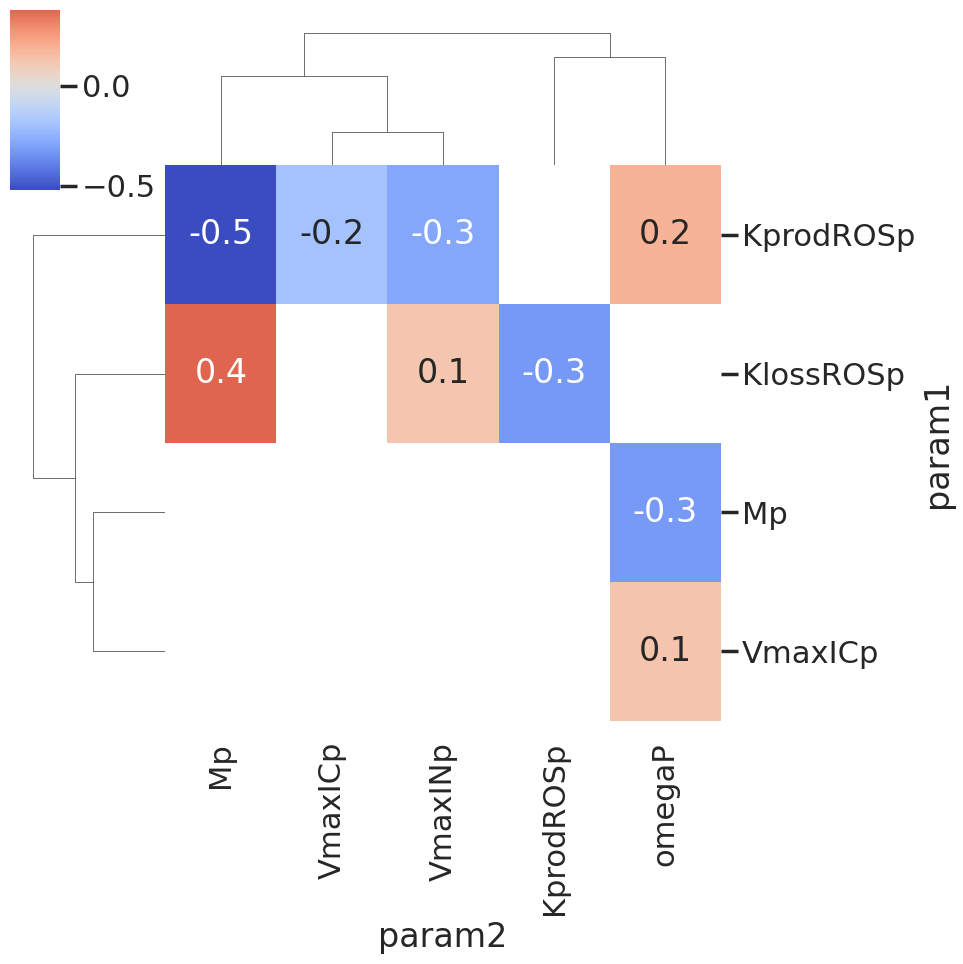

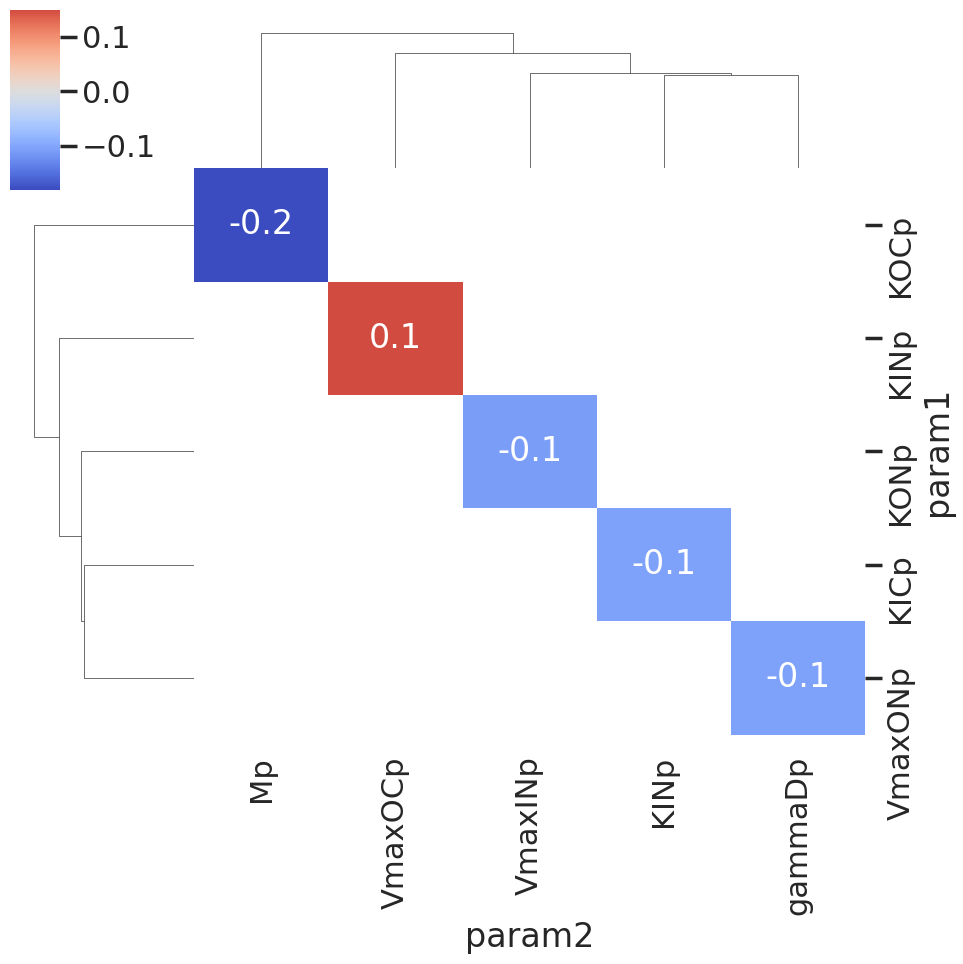

In [132]:
toremove =     tdf.loc[tdf.isna().sum(axis=1).le(2)].fillna(0)

sns.set_context('poster')
for model in ['ROS', 'MIXOTROPH']:
    filtered_correlation_df_m = correlation_df.loc[
        correlation_df.adj_pval.le(0.05) & 
        (np.abs(correlation_df.pearsonr)>0.1) & 
        correlation_df.model.isin([model]) &
        ~correlation_df[['param1', 'param2']].apply(tuple, axis=1).isin(toremove.index.to_list())
    
    ]
    
    tdf2 = filtered_correlation_df_m.pivot_table(values='pearsonr', columns='param2', index='param1') #.dropna(),
    tdf2
    
    sns.clustermap(
        tdf2.fillna(0),
        mask = tdf2.isna(),
        cmap='coolwarm', fmt='.1f', annot=True, #square=True
        center=0, #vmax=1, vmin=-1,
    )
    

#filtered_correlation_df_m

In [133]:
filtered_correlation_df

,model,level_1,param1,param2,pearsonr,pvalue,adj_pval,type,adj_pval_asterisks
9,EXOENZYME,9,Mp,VmaxICp,0.246403,2.447321e-15,1.223660e-14,all VPRO,0.2\n***
10,EXOENZYME,10,Mp,VmaxINp,0.382878,2.286573e-36,3.429860e-35,all VPRO,0.4\n***
12,EXOENZYME,12,VmaxICp,VmaxINp,-0.275587,6.127397e-19,4.595548e-18,all VPRO,-0.3\n***
189,MIXOTROPH,0,KICp,KINp,-0.104688,2.230412e-04,1.254607e-03,all VPRO,-0.1\n**
192,MIXOTROPH,3,KICp,Mp,-0.086609,2.278884e-03,1.139442e-02,all VPRO,-0.1\n*
194,MIXOTROPH,5,KICp,VmaxINp,0.084087,3.055774e-03,1.375098e-02,all VPRO,0.1\n*
203,MIXOTROPH,14,KINp,VmaxOCp,0.148892,1.401798e-07,1.261618e-06,all VPRO,0.1\n***
207,MIXOTROPH,18,KOCp,Mp,-0.181420,1.252078e-10,1.878117e-09,all VPRO,-0.2\n***
212,MIXOTROPH,23,KOCp,gammaDp,-0.071669,1.162256e-02,3.503073e-02,all VPRO,-0.1\n*
213,MIXOTROPH,24,KONp,Mp,-0.078412,5.752951e-03,2.353480e-02,all VPRO,-0.1\n*


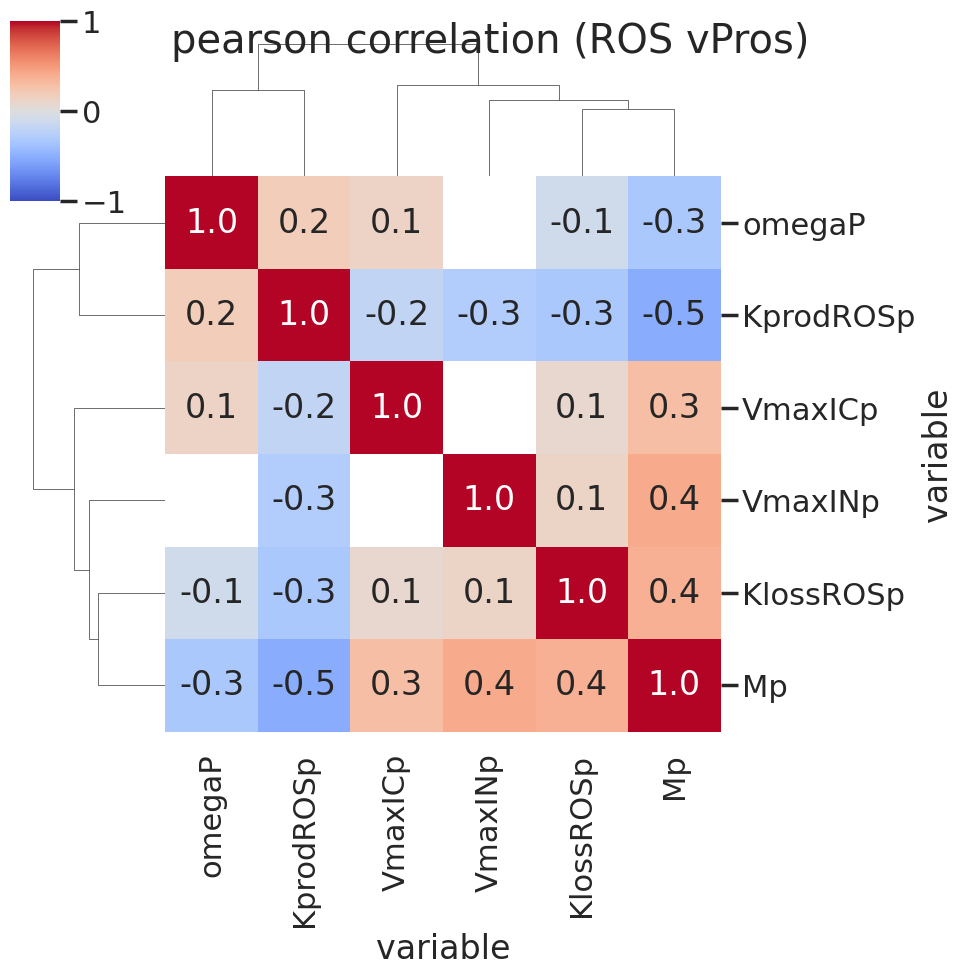

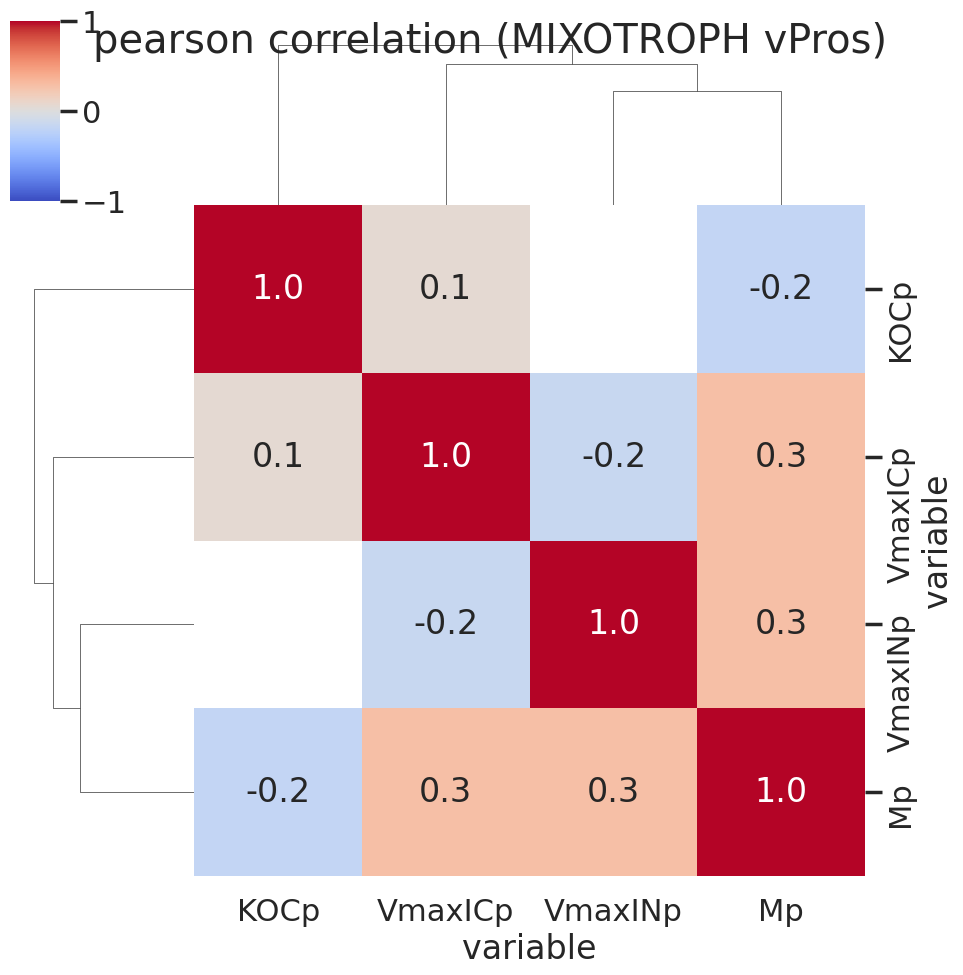

In [134]:
from scipy.stats import pearsonr
for model in ['ROS', 'MIXOTROPH']:
    filtered_correlation_df_m = correlation_df.loc[
        correlation_df.adj_pval.le(0.05) & 
        (np.abs(correlation_df.pearsonr)>0.15) & 
        correlation_df.model.isin([model]) 
    ]
    varslist = set(filtered_correlation_df_m['param1']) | set(filtered_correlation_df_m['param2']) 
    
    data = pmparams_df.loc[
        ~pmparams_df.Versatile_STR.isin(['Not VPRO']) &
        pmparams_df.model.isin([model]), 
        list(varslist)
    ]
    
    corr = data.corr(method=lambda x, y: pearsonr(x, y)[0]) 
    
    # this computes the p-values
    pvalues = data.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(len(data.columns)) 
    corr, pvalues
    
    sns.clustermap(corr, 
            cmap='coolwarm', fmt='.1f', annot=True, #square=True
        center=0, vmax=1, vmin=-1, mask=(pvalues > 0.05)
    )
    plt.xlabel('')
    plt.ylabel('')
    plt.suptitle(f'pearson correlation ({model} vPros)')
